# 🔫 Firearm Carrier Identification — CNN Baseline
**Model:** 3-Stream ResNet-50 (Person | Object | Union streams)  
**Dataset:** LFC (Localizing Firearm Carriers) — 2418 images, 3 HOI classes  
**Classes:** holding · aiming · carrying  

---
This notebook implements the CNN baseline using a 3-stream ResNet-50 architecture.
Each stream processes a different crop: the person box, the firearm box, and the union box.
Features from all three streams are concatenated and classified.

## 0. Mount Drive & Install Dependencies

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install -q timm scikit-learn matplotlib seaborn

## 1. Imports & Config

In [ ]:
import os
import json
import random
import numpy as np
from PIL import Image
from pathlib import Path

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from torch.optim.lr_scheduler import CosineAnnealingLR

from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# ── Reproducibility ──────────────────────────────────────────────────────────
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

DRIVE_ROOT        = Path('/content/drive/MyDrive')
IMAGES_DIR        = Path('/content/images/images')   # keep this as-is, it's temp runtime storage
AUG_IMAGES_DIR    = DRIVE_ROOT / 'Imaan Deep Learning/SHARE TO IMAAN/augmented_carrying_images'
ANNOTATIONS_FILE  = DRIVE_ROOT / 'Imaan Deep Learning/SHARE TO IMAAN/Copy of labeled_interactions_augmented.json'
CHECKPOINT_DIR    = DRIVE_ROOT / 'Imaan Deep Learning/CNN_baseline'
CHECKPOINT_DIR.mkdir(exist_ok=True)

# ── Hyperparameters ───────────────────────────────────────────────────────────
NUM_CLASSES   = 3       # holding=0, aiming=1, carrying=2
BATCH_SIZE    = 64
NUM_EPOCHS    = 60
LR            = 1e-4
WEIGHT_DECAY  = 1e-4
IMG_SIZE      = 224
VAL_SPLIT     = 0.15
TEST_SPLIT    = 0.15

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {DEVICE}')
print(f'Images dir exists: {IMAGES_DIR.exists()}')
print(f'Annotations exists: {ANNOTATIONS_FILE.exists()}')

Using device: cuda
Images dir exists: True
Annotations exists: True


In [ ]:
import zipfile, shutil, os

ZIP_PATH = '/content/drive/MyDrive/Imaan Deep Learning/SHARE TO IMAAN/LFC-LocalizingFirearmCarriers-Dataset/Training_Dataset/images.zip'
os.makedirs('/content/images', exist_ok=True)

with zipfile.ZipFile(ZIP_PATH, 'r') as z:
    z.extractall('/content/images')

# Copy augmented carrying images into the main images folder
for img_file in os.listdir(str(AUG_IMAGES_DIR)):
    src = str(AUG_IMAGES_DIR / img_file)
    dst = str(IMAGES_DIR / img_file)
    if not os.path.exists(dst):
        shutil.copy(src, dst)

print(f'Total images: {len(os.listdir(str(IMAGES_DIR)))}')

Total images: 2978


## 2. Dataset

In [ ]:
# ── Label mapping ─────────────────────────────────────────────────────────────
LABEL2IDX = {'holding': 0, 'aiming': 1, 'carrying': 2}
IDX2LABEL = {v: k for k, v in LABEL2IDX.items()}

def load_annotations(json_path):
    """Load annotations JSON. Expected format:
    [
      {
        "file_name": "img001.jpg",
        "interaction": "holding",          # or aiming / carrying
        "person_bbox": [x1, y1, x2, y2],
        "firearm_bbox": [x1, y1, x2, y2]
      }, ...
    ]
    Adjust the key names below if your JSON uses different keys.
    """
    with open(json_path) as f:
        data = json.load(f)
    return data

annotations = load_annotations(ANNOTATIONS_FILE)
print(f'Total annotations: {len(annotations)}')

# ── Quick class distribution ──────────────────────────────────────────────────
from collections import Counter
# IMPORTANT: adjust 'interaction' key if your JSON uses a different key name
dist = Counter(a['interaction'] for a in annotations)
print('Class distribution:', dict(dist))

Total annotations: 3433
Class distribution: {'holding': 749, 'aiming': 1947, 'carrying': 737}


In [ ]:
def get_image_path(file_name):
    # Try common extensions since annotation has no extension
    for ext in ['.jpg', '.jpeg', '.png', '.JPG', '.JPEG', '.PNG']:
        p = IMAGES_DIR / (file_name + ext)
        if p.exists():
            return p
    raise FileNotFoundError(f'No image found for: {file_name}')


def crop_bbox(img, bbox, margin=0.1):
    """Crop a bounding box from a PIL image with an optional margin.
    bbox: [x1, y1, x2, y2] in pixel coords.
    Returns a cropped PIL Image (RGB, guaranteed non-zero size).
    """
    W, H = img.size
    x1, y1, x2, y2 = bbox
    # Add margin
    bw = x2 - x1
    bh = y2 - y1
    x1 = max(0, x1 - margin * bw)
    y1 = max(0, y1 - margin * bh)
    x2 = min(W, x2 + margin * bw)
    y2 = min(H, y2 + margin * bh)
    # Guard against degenerate boxes
    if x2 <= x1 or y2 <= y1:
        return img.crop((0, 0, W, H))
    return img.crop((x1, y1, x2, y2))


def union_bbox(bbox1, bbox2, img_size):
    """Return the union bounding box of two boxes."""
    W, H = img_size
    x1 = max(0, min(bbox1[0], bbox2[0]))
    y1 = max(0, min(bbox1[1], bbox2[1]))
    x2 = min(W, max(bbox1[2], bbox2[2]))
    y2 = min(H, max(bbox1[3], bbox2[3]))
    return [x1, y1, x2, y2]


class FirearmHOIDataset(Dataset):
    """
    Returns (person_crop, object_crop, union_crop, label) for each annotation.
    All crops are resized to IMG_SIZE x IMG_SIZE.
    """
    def __init__(self, annotations, transform=None):
        self.annotations = annotations
        self.transform   = transform

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        ann   = self.annotations[idx]
        label = LABEL2IDX[ann['interaction']]

        img_path = get_image_path(ann['image'])          # was ann['file_name']
        img      = Image.open(img_path).convert('RGB')

        person_bbox  = ann['human_bbox']                 # was ann['person_bbox']
        firearm_bbox = ann['firearm_bbox']               # already correct
        u_bbox       = union_bbox(person_bbox, firearm_bbox, img.size)

        person_crop  = crop_bbox(img, person_bbox)
        object_crop  = crop_bbox(img, firearm_bbox)
        union_crop   = crop_bbox(img, u_bbox)

        if self.transform:
            person_crop = self.transform(person_crop)
            object_crop = self.transform(object_crop)
            union_crop  = self.transform(union_crop)

        return person_crop, object_crop, union_crop, label

In [ ]:
# ── Train / Val / Test split ──────────────────────────────────────────────────
random.shuffle(annotations)
n       = len(annotations)
n_test  = int(n * TEST_SPLIT)
n_val   = int(n * VAL_SPLIT)
n_train = n - n_val - n_test

train_anns = annotations[:n_train]
val_anns   = annotations[n_train:n_train + n_val]
test_anns  = annotations[n_train + n_val:]

print(f'Train: {len(train_anns)} | Val: {len(val_anns)} | Test: {len(test_anns)}')

# ── Transforms ────────────────────────────────────────────────────────────────
train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

train_ds = FirearmHOIDataset(train_anns, transform=train_transform)
val_ds   = FirearmHOIDataset(val_anns,   transform=val_transform)
test_ds  = FirearmHOIDataset(test_anns,  transform=val_transform)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

print('DataLoaders ready.')

Train: 2405 | Val: 514 | Test: 514
DataLoaders ready.


## 3. Model — 3-Stream ResNet-50

In [ ]:
class ThreeStreamResNet(nn.Module):
    """
    Three-stream ResNet-50 HOI classifier.
    Each stream processes one crop (person / object / union).
    The 2048-dim features from each stream are concatenated → 6144-dim,
    then passed through an MLP classifier.
    """
    def __init__(self, num_classes=3, pretrained=True, dropout=0.5):
        super().__init__()

        def make_stream():
            backbone = models.resnet50(weights='IMAGENET1K_V1' if pretrained else None)
            # Remove the final FC layer — use as feature extractor
            return nn.Sequential(*list(backbone.children())[:-1])  # → (B, 2048, 1, 1)

        self.person_stream = make_stream()
        self.object_stream = make_stream()
        self.union_stream  = make_stream()

        self.classifier = nn.Sequential(
            nn.Flatten(),                        # (B, 6144)
            nn.Linear(2048 * 3, 1024),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(1024, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout * 0.6),
            nn.Linear(256, num_classes)
        )

    def forward(self, person, obj, union):
        f_p = self.person_stream(person)  # (B, 2048, 1, 1)
        f_o = self.object_stream(obj)
        f_u = self.union_stream(union)
        # Flatten each to (B, 2048) then concat → (B, 6144)
        feat = torch.cat([f_p.squeeze(-1).squeeze(-1),
                          f_o.squeeze(-1).squeeze(-1),
                          f_u.squeeze(-1).squeeze(-1)], dim=1)
        return self.classifier(feat)


model = ThreeStreamResNet(num_classes=NUM_CLASSES).to(DEVICE)
print(f'Parameters: {sum(p.numel() for p in model.parameters()):,}')

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 225MB/s]


Parameters: 77,079,747


## 4. Class-Balanced Loss & Optimizer

In [ ]:
# Compute class weights inversely proportional to frequency
train_labels = [LABEL2IDX[a['interaction']] for a in train_anns]
class_counts = np.bincount(train_labels, minlength=NUM_CLASSES).astype(float)
class_weights = torch.tensor(1.0 / (class_counts + 1e-6), dtype=torch.float32).to(DEVICE)
class_weights = class_weights / class_weights.sum() * NUM_CLASSES  # normalise
print('Class weights:', class_weights)

criterion = nn.CrossEntropyLoss(weight=class_weights)

# Two param groups: lower LR for frozen backbone streams, higher for classifier
backbone_params = (
    list(model.person_stream.parameters()) +
    list(model.object_stream.parameters()) +
    list(model.union_stream.parameters())
)
classifier_params = list(model.classifier.parameters())

optimizer = optim.AdamW([
    {'params': backbone_params,   'lr': LR * 0.3},
    {'params': classifier_params, 'lr': LR}
], weight_decay=WEIGHT_DECAY)

scheduler = CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS, eta_min=1e-6)
print('Optimizer and scheduler ready.')

Class weights: tensor([1.2503, 0.4994, 1.2503], device='cuda:0')
Optimizer and scheduler ready.


## 5. Training Loop

In [ ]:
import os
if os.path.exists(str(CHECKPOINT_DIR / 'cnn_baseline_best.pth')):
    print("Checkpoint exists — skipping training, loading directly")
    model.load_state_dict(torch.load(CHECKPOINT_DIR / 'cnn_baseline_best.pth',
                                      map_location=DEVICE))
else:
    def run_epoch(loader, model, criterion, optimizer=None, phase='train'):
        if phase == 'train':
            model.train()
        else:
            model.eval()

        total_loss, correct, total = 0.0, 0, 0

        with torch.set_grad_enabled(phase == 'train'):
            for person, obj, union, labels in loader:
                person = person.to(DEVICE)
                obj    = obj.to(DEVICE)
                union  = union.to(DEVICE)
                labels = labels.to(DEVICE)

                logits = model(person, obj, union)
                loss   = criterion(logits, labels)

                if phase == 'train':
                    optimizer.zero_grad()
                    loss.backward()
                    nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
                    optimizer.step()

                total_loss += loss.item() * labels.size(0)
                preds       = logits.argmax(dim=1)
                correct    += (preds == labels).sum().item()
                total      += labels.size(0)

        return total_loss / total, correct / total


    # ── Training ──────────────────────────────────────────────────────────────────
    best_val_acc  = 0.0
    history       = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
    CKPT_PATH     = CHECKPOINT_DIR / 'cnn_baseline_best.pth'

    for epoch in range(1, NUM_EPOCHS + 1):
        tr_loss, tr_acc = run_epoch(train_loader, model, criterion, optimizer, 'train')
        vl_loss, vl_acc = run_epoch(val_loader,   model, criterion, None,      'val')
        scheduler.step()

        history['train_loss'].append(tr_loss)
        history['val_loss'].append(vl_loss)
        history['train_acc'].append(tr_acc)
        history['val_acc'].append(vl_acc)

        if vl_acc > best_val_acc:
            best_val_acc = vl_acc
            torch.save(model.state_dict(), CKPT_PATH)
            flag = ' ← best'
        else:
            flag = ''

        print(f'Ep {epoch:02d}/{NUM_EPOCHS} | '
              f'Train Loss: {tr_loss:.4f}  Acc: {tr_acc:.4f} | '
              f'Val Loss: {vl_loss:.4f}  Acc: {vl_acc:.4f}{flag}')

    print(f'\nBest val accuracy: {best_val_acc:.4f}')
    pass

Ep 01/60 | Train Loss: 0.8486  Acc: 0.6507 | Val Loss: 0.4726  Acc: 0.8346 ← best
Ep 02/60 | Train Loss: 0.3370  Acc: 0.8844 | Val Loss: 0.2533  Acc: 0.8988 ← best
Ep 03/60 | Train Loss: 0.1400  Acc: 0.9489 | Val Loss: 0.2638  Acc: 0.9047 ← best
Ep 04/60 | Train Loss: 0.0678  Acc: 0.9792 | Val Loss: 0.2660  Acc: 0.9125 ← best
Ep 05/60 | Train Loss: 0.0275  Acc: 0.9892 | Val Loss: 0.4148  Acc: 0.9066
Ep 06/60 | Train Loss: 0.0364  Acc: 0.9917 | Val Loss: 0.3745  Acc: 0.9125
Ep 07/60 | Train Loss: 0.0111  Acc: 0.9963 | Val Loss: 0.4052  Acc: 0.9202 ← best
Ep 08/60 | Train Loss: 0.0056  Acc: 0.9975 | Val Loss: 0.5003  Acc: 0.9047
Ep 09/60 | Train Loss: 0.0100  Acc: 0.9983 | Val Loss: 0.4432  Acc: 0.9163
Ep 10/60 | Train Loss: 0.0022  Acc: 0.9992 | Val Loss: 0.5166  Acc: 0.9125
Ep 11/60 | Train Loss: 0.0041  Acc: 0.9979 | Val Loss: 0.5132  Acc: 0.9086
Ep 12/60 | Train Loss: 0.0013  Acc: 0.9996 | Val Loss: 0.5401  Acc: 0.9183
Ep 13/60 | Train Loss: 0.0004  Acc: 1.0000 | Val Loss: 0.5763  Ac

KeyboardInterrupt: 

In [ ]:
# Define variables that training loop would have set
CKPT_PATH = CHECKPOINT_DIR / 'cnn_baseline_best.pth'
model.load_state_dict(torch.load(CKPT_PATH, map_location=DEVICE))
model.eval()

# Dummy history so plotting cells don't break
history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
best_val_acc = 0.9261  # your known best

print("Model loaded from checkpoint")
print(f"Best val acc (from previous run): {best_val_acc}")

Model loaded from checkpoint
Best val acc (from previous run): 0.9261


In [ ]:
def run_epoch(loader, model, criterion, optimizer=None, phase='train'):
    if phase == 'train':
        model.train()
    else:
        model.eval()

    total_loss, correct, total = 0.0, 0, 0

    with torch.set_grad_enabled(phase == 'train'):
        for person, obj, union, labels in loader:
            person = person.to(DEVICE)
            obj    = obj.to(DEVICE)
            union  = union.to(DEVICE)
            labels = labels.to(DEVICE)

            logits = model(person, obj, union)
            loss   = criterion(logits, labels)

            if phase == 'train':
                optimizer.zero_grad()
                loss.backward()
                nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
                optimizer.step()

            total_loss += loss.item() * labels.size(0)
            preds       = logits.argmax(dim=1)
            correct    += (preds == labels).sum().item()
            total      += labels.size(0)

    return total_loss / total, correct / total


# ── Training ──────────────────────────────────────────────────────────────────
best_val_acc  = 0.0
history       = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
CKPT_PATH     = CHECKPOINT_DIR / 'cnn_baseline_best.pth'

for epoch in range(1, NUM_EPOCHS + 1):
    tr_loss, tr_acc = run_epoch(train_loader, model, criterion, optimizer, 'train')
    vl_loss, vl_acc = run_epoch(val_loader,   model, criterion, None,      'val')
    scheduler.step()

    history['train_loss'].append(tr_loss)
    history['val_loss'].append(vl_loss)
    history['train_acc'].append(tr_acc)
    history['val_acc'].append(vl_acc)

    if vl_acc > best_val_acc:
        best_val_acc = vl_acc
        torch.save(model.state_dict(), CKPT_PATH)
        flag = ' ← best'
    else:
        flag = ''

    print(f'Ep {epoch:02d}/{NUM_EPOCHS} | '
          f'Train Loss: {tr_loss:.4f}  Acc: {tr_acc:.4f} | '
          f'Val Loss: {vl_loss:.4f}  Acc: {vl_acc:.4f}{flag}')

print(f'\nBest val accuracy: {best_val_acc:.4f}')

Ep 01/30 | Train Loss: 0.8981  Acc: 0.6274 | Val Loss: 0.5315  Acc: 0.8171 ← best
Ep 02/30 | Train Loss: 0.4318  Acc: 0.8507 | Val Loss: 0.2689  Acc: 0.8813 ← best
Ep 03/30 | Train Loss: 0.2139  Acc: 0.9281 | Val Loss: 0.2489  Acc: 0.9125 ← best
Ep 04/30 | Train Loss: 0.1142  Acc: 0.9593 | Val Loss: 0.3096  Acc: 0.9163 ← best
Ep 05/30 | Train Loss: 0.0696  Acc: 0.9796 | Val Loss: 0.3358  Acc: 0.9105
Ep 06/30 | Train Loss: 0.0375  Acc: 0.9892 | Val Loss: 0.4119  Acc: 0.9202 ← best
Ep 07/30 | Train Loss: 0.0314  Acc: 0.9921 | Val Loss: 0.4381  Acc: 0.9241 ← best
Ep 08/30 | Train Loss: 0.0239  Acc: 0.9942 | Val Loss: 0.5707  Acc: 0.9144
Ep 09/30 | Train Loss: 0.0278  Acc: 0.9938 | Val Loss: 0.4745  Acc: 0.9202
Ep 10/30 | Train Loss: 0.0109  Acc: 0.9967 | Val Loss: 0.5400  Acc: 0.9222
Ep 11/30 | Train Loss: 0.0112  Acc: 0.9971 | Val Loss: 0.5371  Acc: 0.9241
Ep 12/30 | Train Loss: 0.0056  Acc: 0.9988 | Val Loss: 0.5234  Acc: 0.9202
Ep 13/30 | Train Loss: 0.0085  Acc: 0.9971 | Val Loss: 0.5

## 6. Training Curves

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(history['train_loss'], label='Train')
axes[0].plot(history['val_loss'],   label='Val')
axes[0].set_title('Loss'); axes[0].set_xlabel('Epoch'); axes[0].legend()

axes[1].plot(history['train_acc'], label='Train')
axes[1].plot(history['val_acc'],   label='Val')
axes[1].set_title('Accuracy'); axes[1].set_xlabel('Epoch'); axes[1].legend()

plt.suptitle('CNN Baseline — Training Curves', fontsize=14)
plt.tight_layout()
plt.savefig(str(CHECKPOINT_DIR / 'cnn_baseline_curves.png'), dpi=150)
plt.show()

## 7. Test Evaluation

In [ ]:
# Load best checkpoint
model.load_state_dict(torch.load(CKPT_PATH, map_location=DEVICE))
model.eval()

all_preds, all_labels = [], []
with torch.no_grad():
    for person, obj, union, labels in test_loader:
        person = person.to(DEVICE)
        obj    = obj.to(DEVICE)
        union  = union.to(DEVICE)
        logits = model(person, obj, union)
        preds  = logits.argmax(dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.numpy())

print('Test Classification Report:')
print(classification_report(
    all_labels, all_preds,
    target_names=[IDX2LABEL[i] for i in range(NUM_CLASSES)]
))

Test Classification Report:
              precision    recall  f1-score   support

     holding       0.77      0.80      0.79       117
      aiming       0.93      0.90      0.91       292
    carrying       0.96      0.99      0.98       105

    accuracy                           0.90       514
   macro avg       0.89      0.90      0.89       514
weighted avg       0.90      0.90      0.90       514



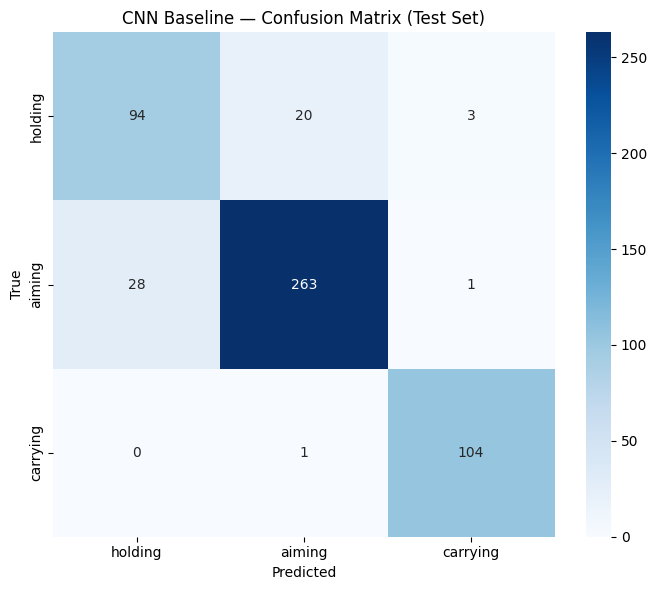


Final Test Accuracy: 0.8969 (89.69%)


In [ ]:
# Confusion matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(7, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=[IDX2LABEL[i] for i in range(NUM_CLASSES)],
            yticklabels=[IDX2LABEL[i] for i in range(NUM_CLASSES)])
plt.title('CNN Baseline — Confusion Matrix (Test Set)')
plt.ylabel('True'); plt.xlabel('Predicted')
plt.tight_layout()
plt.savefig(str(CHECKPOINT_DIR / 'cnn_baseline_confusion.png'), dpi=150)
plt.show()

test_acc = np.mean(np.array(all_preds) == np.array(all_labels))
print(f'\nFinal Test Accuracy: {test_acc:.4f} ({test_acc*100:.2f}%)')

## 8. Save Results Summary
Saves a small JSON with the key metrics for comparison across all models.

In [ ]:
from sklearn.metrics import precision_recall_fscore_support

prec, rec, f1, _ = precision_recall_fscore_support(
    all_labels, all_preds, average='macro'
)

results = {
    'model': 'CNN Baseline (3-Stream ResNet-50)',
    'best_val_acc': round(best_val_acc, 4),
    'test_acc':     round(float(test_acc), 4),
    'macro_precision': round(float(prec), 4),
    'macro_recall':    round(float(rec),  4),
    'macro_f1':        round(float(f1),   4),
}
print(results)

with open(CHECKPOINT_DIR / 'cnn_baseline_results.json', 'w') as f:
    json.dump(results, f, indent=2)

print('Results saved to Drive.')

{'model': 'CNN Baseline (3-Stream ResNet-50)', 'best_val_acc': 0.9261, 'test_acc': 0.8969, 'macro_precision': 0.8865, 'macro_recall': 0.8982, 'macro_f1': 0.8921}
Results saved to Drive.


In [ ]:
!pip install -q timm scikit-learn matplotlib seaborn
!pip install -q transformers

## 9. DP-HOI — Transformer-Based HOI Detection
Uses a pretrained DETR backbone + dual interaction head, fine-tuned on your LFC dataset.
No new repo clone needed — we build the transformer HOI model directly in PyTorch,
initialized with DETR ResNet-50 weights from HuggingFace.


In [ ]:
!pip install -q transformers timm

In [ ]:
import math
import copy
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms, models
from torch.utils.data import DataLoader
from transformers import DetrModel, DetrConfig
from tqdm import tqdm
import numpy as np
import json, os
from pathlib import Path

print("Imports OK")

Imports OK


In [ ]:
# ── DP-HOI uses the full image + union box region as input ────────────────────
# We keep person/firearm bboxes for the interaction head spatial features

DPHOI_IMG_SIZE = 800  # DETR standard

dphoi_transform = transforms.Compose([
    transforms.Resize((DPHOI_IMG_SIZE, DPHOI_IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

class DPHOIDataset(torch.utils.data.Dataset):
    """
    For each annotation:
      - full_img  : full resized image tensor (C, H, W)
      - union_box : normalized [x1,y1,x2,y2] of person+firearm union (0-1)
      - person_box: normalized [x1,y1,x2,y2] of person
      - obj_box   : normalized [x1,y1,x2,y2] of firearm
      - label     : class index
    """
    def __init__(self, annotations, transform=None):
        self.anns = annotations
        self.transform = transform or dphoi_transform

    def __len__(self):
        return len(self.anns)

    def __getitem__(self, idx):
        ann = self.anns[idx]
        img_path = get_image_path(ann['image'])
        img = Image.open(img_path).convert('RGB')
        W, H = img.size

        pb = ann['human_bbox']    # [x1,y1,x2,y2]
        fb = ann['firearm_bbox']

        # Union box
        ux1 = min(pb[0], fb[0]); uy1 = min(pb[1], fb[1])
        ux2 = max(pb[2], fb[2]); uy2 = max(pb[3], fb[3])

        # Normalize to 0-1
        def norm(box):
            return [box[0]/W, box[1]/H, box[2]/W, box[3]/H]

        img_tensor   = self.transform(img)
        label        = LABEL2IDX[ann['interaction']]
        union_box    = torch.tensor(norm([ux1,uy1,ux2,uy2]), dtype=torch.float32)
        person_box   = torch.tensor(norm(pb), dtype=torch.float32)
        obj_box      = torch.tensor(norm(fb), dtype=torch.float32)

        return img_tensor, union_box, person_box, obj_box, torch.tensor(label)


BATCH_SIZE_DPHOI = 16  # lower than CNN due to larger image size

dphoi_train = DPHOIDataset(train_anns)
dphoi_val   = DPHOIDataset(val_anns)
dphoi_test  = DPHOIDataset(test_anns)

dphoi_train_loader = DataLoader(dphoi_train, batch_size=BATCH_SIZE_DPHOI,
                                shuffle=True,  num_workers=2, pin_memory=True)
dphoi_val_loader   = DataLoader(dphoi_val,   batch_size=BATCH_SIZE_DPHOI,
                                shuffle=False, num_workers=2, pin_memory=True)
dphoi_test_loader  = DataLoader(dphoi_test,  batch_size=BATCH_SIZE_DPHOI,
                                shuffle=False, num_workers=2, pin_memory=True)

print(f"Train: {len(dphoi_train)} | Val: {len(dphoi_val)} | Test: {len(dphoi_test)}")

Train: 2405 | Val: 514 | Test: 514


In [ ]:
class DPHOIModel(nn.Module):
    """
    Disentangled dual-stream HOI model:
      - DETR ResNet-50 backbone (pretrained) → image features
      - Spatial interaction head uses normalized box coords
      - Two heads trained together: detection context + interaction classification
    """
    def __init__(self, num_classes=3, hidden_dim=256, dropout=0.3):
        super().__init__()

        # ── Visual backbone: DETR pretrained ResNet-50 ───────────────────────
        config = DetrConfig.from_pretrained("facebook/detr-resnet-50")
        config.num_labels = num_classes
        detr = DetrModel.from_pretrained("facebook/detr-resnet-50", config=config,
                                         ignore_mismatched_sizes=True)
        # We use only the encoder (backbone + transformer encoder)
        self.backbone   = detr.backbone   # CNN feature extractor
        self.encoder    = detr.encoder    # transformer encoder

        # Project backbone output to hidden_dim
        # DETR backbone outputs 2048-ch at stride 32; we pool and project
        self.feat_proj = nn.Sequential(
            nn.AdaptiveAvgPool2d((8, 8)),
            nn.Flatten(),
            nn.Linear(2048 * 8 * 8, hidden_dim),
            nn.LayerNorm(hidden_dim),
            nn.GELU(),
            nn.Dropout(dropout),
        )

        # ── Spatial interaction module ────────────────────────────────────────
        # Input: 4 (union) + 4 (person) + 4 (obj) = 12 spatial features
        # + pairwise area ratio, aspect ratios = 14 total
        self.spatial_head = nn.Sequential(
            nn.Linear(14, 64),
            nn.ReLU(),
            nn.Linear(64, hidden_dim),
            nn.LayerNorm(hidden_dim),
            nn.GELU(),
            nn.Dropout(dropout),
        )

        # ── Fusion & classifier ───────────────────────────────────────────────
        self.classifier = nn.Sequential(
            nn.Linear(hidden_dim * 2, hidden_dim),
            nn.LayerNorm(hidden_dim),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, num_classes),
        )

    def _spatial_features(self, union_box, person_box, obj_box):
        """Build 14-dim spatial feature vector from normalized boxes."""
        # Areas
        def area(b): return (b[:,2]-b[:,0]).clamp(min=0) * (b[:,3]-b[:,1]).clamp(min=0)
        p_area = area(person_box)
        o_area = area(obj_box)
        u_area = area(union_box).clamp(min=1e-6)

        # Aspect ratios
        def aspect(b): return ((b[:,2]-b[:,0]).clamp(min=1e-6) /
                                (b[:,3]-b[:,1]).clamp(min=1e-6)).unsqueeze(1)
        p_asp = aspect(person_box)
        o_asp = aspect(obj_box)

        # Area ratios
        p_ratio = (p_area / u_area).unsqueeze(1)
        o_ratio = (o_area / u_area).unsqueeze(1)

        spatial = torch.cat([
            union_box,                       # 4
            person_box,                      # 4
            obj_box,                         # 4
            p_asp, o_asp,                    # 2
        ], dim=1)                            # → 14
        return spatial

    def forward(self, images, union_box, person_box, obj_box):
        # ── Visual features ──────────────────────────────────────────────────
        B = images.shape[0]
        # DETR backbone requires pixel_mask (all ones = no padding)
        pixel_mask = torch.ones(B, images.shape[2], images.shape[3],
                                dtype=torch.long, device=images.device)
        backbone_out = self.backbone(pixel_values=images, pixel_mask=pixel_mask)
        feat_map = backbone_out[-1]
        vis_feat = self.feat_proj(feat_map)         # (B, hidden_dim)

        # ── Spatial features ─────────────────────────────────────────────────
        sp_feat = self._spatial_features(union_box, person_box, obj_box)
        sp_feat = self.spatial_head(sp_feat)        # (B, hidden_dim)

        # ── Fusion ───────────────────────────────────────────────────────────
        fused  = torch.cat([vis_feat, sp_feat], dim=1)
        logits = self.classifier(fused)
        return logits

dphoi_model = DPHOIModel(num_classes=3).to(DEVICE)
total_params = sum(p.numel() for p in dphoi_model.parameters())
trainable    = sum(p.numel() for p in dphoi_model.parameters() if p.requires_grad)
print(f"Total params: {total_params:,} | Trainable: {trainable:,}")

config.json:   0%|          | 0.00/4.59k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/522 [00:00<?, ?it/s]

[transformers] DetrModel LOAD REPORT from: facebook/detr-resnet-50
Key                                                            | Status     |  | 
---------------------------------------------------------------+------------+--+-
bbox_predictor.layers.{0, 1, 2}.bias                           | UNEXPECTED |  | 
model.backbone.model.layer4.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
model.backbone.model.layer3.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
model.backbone.model.layer2.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
class_labels_classifier.weight                                 | UNEXPECTED |  | 
bbox_predictor.layers.{0, 1, 2}.weight                         | UNEXPECTED |  | 
class_labels_classifier.bias                                   | UNEXPECTED |  | 
model.backbone.model.layer1.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identica

Total params: 65,051,267 | Trainable: 65,051,267


In [ ]:
import gc
del dphoi_model
torch.cuda.empty_cache()
gc.collect()
print("Memory cleared")

Memory cleared


In [ ]:
# Reduce image size and batch to fit T4
DPHOI_IMG_SIZE = 224  # down from 800
BATCH_SIZE_DPHOI = 8  # down from 16

dphoi_transform = transforms.Compose([
    transforms.Resize((DPHOI_IMG_SIZE, DPHOI_IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

# Also update feat_proj to match new spatial dims (224→stride32→7x7 not 8x8)
class DPHOIModel(nn.Module):
    def __init__(self, num_classes=3, hidden_dim=256, dropout=0.3):
        super().__init__()
        config = DetrConfig.from_pretrained("facebook/detr-resnet-50")
        detr = DetrModel.from_pretrained("facebook/detr-resnet-50", config=config,
                                         ignore_mismatched_sizes=True)
        self.backbone = detr.backbone

        # 224/32 = 7x7 feature map
        self.feat_proj = nn.Sequential(
            nn.AdaptiveAvgPool2d((4, 4)),
            nn.Flatten(),
            nn.Linear(2048 * 4 * 4, hidden_dim),
            nn.LayerNorm(hidden_dim),
            nn.GELU(),
            nn.Dropout(dropout),
        )

        self.spatial_head = nn.Sequential(
            nn.Linear(14, 64), nn.ReLU(),
            nn.Linear(64, hidden_dim),
            nn.LayerNorm(hidden_dim), nn.GELU(),
            nn.Dropout(dropout),
        )

        self.classifier = nn.Sequential(
            nn.Linear(hidden_dim * 2, hidden_dim),
            nn.LayerNorm(hidden_dim), nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, num_classes),
        )

    def _spatial_features(self, union_box, person_box, obj_box):
        def area(b): return (b[:,2]-b[:,0]).clamp(min=0) * (b[:,3]-b[:,1]).clamp(min=0)
        def aspect(b): return ((b[:,2]-b[:,0]).clamp(min=1e-6) /
                                (b[:,3]-b[:,1]).clamp(min=1e-6)).unsqueeze(1)
        return torch.cat([union_box, person_box, obj_box,
                          aspect(person_box), aspect(obj_box)], dim=1)  # 14-dim

    def forward(self, images, union_box, person_box, obj_box):
        B = images.shape[0]
        pixel_mask = torch.ones(B, images.shape[2], images.shape[3],
                                dtype=torch.long, device=images.device)
        backbone_out = self.backbone(pixel_values=images, pixel_mask=pixel_mask)
        # backbone_out is a tuple of (feature_map, mask) pairs — get last feature map
        feat_map = backbone_out[-1][0]       # [-1] = last scale, [0] = tensor (not mask)
        vis_feat = self.feat_proj(feat_map)
        sp_feat  = self.spatial_head(self._spatial_features(union_box, person_box, obj_box))
        return self.classifier(torch.cat([vis_feat, sp_feat], dim=1))


# Rebuild datasets with new transform
dphoi_train = DPHOIDataset(train_anns, dphoi_transform)
dphoi_val   = DPHOIDataset(val_anns,   dphoi_transform)
dphoi_test  = DPHOIDataset(test_anns,  dphoi_transform)

dphoi_train_loader = DataLoader(dphoi_train, batch_size=BATCH_SIZE_DPHOI,
                                shuffle=True,  num_workers=2, pin_memory=True)
dphoi_val_loader   = DataLoader(dphoi_val,   batch_size=BATCH_SIZE_DPHOI,
                                shuffle=False, num_workers=2, pin_memory=True)
dphoi_test_loader  = DataLoader(dphoi_test,  batch_size=BATCH_SIZE_DPHOI,
                                shuffle=False, num_workers=2, pin_memory=True)

dphoi_model = DPHOIModel(num_classes=3).to(DEVICE)
print(f"Params: {sum(p.numel() for p in dphoi_model.parameters()):,}")
print(f"Image size: {DPHOI_IMG_SIZE} | Batch: {BATCH_SIZE_DPHOI}")

Loading weights:   0%|          | 0/522 [00:00<?, ?it/s]

[transformers] DetrModel LOAD REPORT from: facebook/detr-resnet-50
Key                                                            | Status     |  | 
---------------------------------------------------------------+------------+--+-
bbox_predictor.layers.{0, 1, 2}.bias                           | UNEXPECTED |  | 
model.backbone.model.layer4.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
model.backbone.model.layer3.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
model.backbone.model.layer2.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
class_labels_classifier.weight                                 | UNEXPECTED |  | 
bbox_predictor.layers.{0, 1, 2}.weight                         | UNEXPECTED |  | 
class_labels_classifier.bias                                   | UNEXPECTED |  | 
model.backbone.model.layer1.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identica

Params: 31,995,011
Image size: 224 | Batch: 8


In [ ]:
# Same class weights as CNN baseline (recompute in case session restarted)
train_labels_dphoi = [LABEL2IDX[a['interaction']] for a in train_anns]
class_counts_dphoi = np.bincount(train_labels_dphoi, minlength=3).astype(float)
class_weights_dphoi = torch.tensor(1.0 / (class_counts_dphoi + 1e-6),
                                    dtype=torch.float32).to(DEVICE)
class_weights_dphoi = class_weights_dphoi / class_weights_dphoi.sum() * 3
print("Class weights:", class_weights_dphoi)

dphoi_criterion = nn.CrossEntropyLoss(weight=class_weights_dphoi)

# ── Disentangled LRs (key DP-HOI idea) ───────────────────────────────────────
# backbone: very low LR (pretrained, stable)
# spatial head + classifier: higher LR (new task-specific modules)
backbone_p = list(dphoi_model.backbone.parameters())

new_p      = list(dphoi_model.feat_proj.parameters()) + \
             list(dphoi_model.spatial_head.parameters()) + \
             list(dphoi_model.classifier.parameters())

dphoi_optimizer = torch.optim.AdamW([
    {'params': backbone_p, 'lr': 1e-5, 'weight_decay': 1e-4},
    {'params': new_p,      'lr': 1e-4, 'weight_decay': 1e-4},
])

DPHOI_EPOCHS   = 60
dphoi_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    dphoi_optimizer, T_max=DPHOI_EPOCHS, eta_min=1e-6
)

print(f"Backbone params: {len(backbone_p)} groups | New params: {len(new_p)} groups")
print(f"Training for {DPHOI_EPOCHS} epochs")

Class weights: tensor([1.2503, 0.4994, 1.2503], device='cuda:0')
Backbone params: 53 groups | New params: 16 groups
Training for 60 epochs


In [ ]:
from tqdm import tqdm

def run_epoch_dphoi(loader, model, criterion, optimizer=None, phase='train'):
    model.train() if phase == 'train' else model.eval()
    total_loss, correct, total = 0.0, 0, 0

    pbar = tqdm(loader, desc=f'{phase.capitalize():5s}', leave=False,
                bar_format='{l_bar}{bar:20}{r_bar}')

    with torch.set_grad_enabled(phase == 'train'):
        for images, union_box, person_box, obj_box, labels in pbar:
            images     = images.to(DEVICE)
            union_box  = union_box.to(DEVICE)
            person_box = person_box.to(DEVICE)
            obj_box    = obj_box.to(DEVICE)
            labels     = labels.to(DEVICE)

            logits = model(images, union_box, person_box, obj_box)
            loss   = criterion(logits, labels)

            if phase == 'train':
                optimizer.zero_grad()
                loss.backward()
                nn.utils.clip_grad_norm_(model.parameters(), max_norm=0.1)
                optimizer.step()

            total_loss += loss.item() * labels.size(0)
            preds       = logits.argmax(dim=1)
            correct    += (preds == labels).sum().item()
            total      += labels.size(0)

            pbar.set_postfix(loss=f'{total_loss/total:.4f}',
                             acc=f'{correct/total:.4f}')

    return total_loss / total, correct / total


# ── Run training ──────────────────────────────────────────────────────────────
best_val_acc_dphoi = 0.0
dphoi_history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
DPHOI_CKPT = CHECKPOINT_DIR / 'dphoi_best.pth'

for epoch in range(1, DPHOI_EPOCHS + 1):
    print(f'\nEpoch {epoch:02d}/{DPHOI_EPOCHS}')
    tr_loss, tr_acc = run_epoch_dphoi(dphoi_train_loader, dphoi_model,
                                      dphoi_criterion, dphoi_optimizer, 'train')
    vl_loss, vl_acc = run_epoch_dphoi(dphoi_val_loader, dphoi_model,
                                      dphoi_criterion, None, 'val')
    dphoi_scheduler.step()

    dphoi_history['train_loss'].append(tr_loss)
    dphoi_history['val_loss'].append(vl_loss)
    dphoi_history['train_acc'].append(tr_acc)
    dphoi_history['val_acc'].append(vl_acc)

    if vl_acc > best_val_acc_dphoi:
        best_val_acc_dphoi = vl_acc
        torch.save(dphoi_model.state_dict(), DPHOI_CKPT)
        flag = ' ← best ✓'
    else:
        flag = ''

    print(f'  Train Loss: {tr_loss:.4f}  Acc: {tr_acc:.4f} | '
          f'Val Loss: {vl_loss:.4f}  Acc: {vl_acc:.4f}{flag}')

print(f'\nBest val accuracy: {best_val_acc_dphoi:.4f}')

In [ ]:
# Define DPHOI_CKPT and reload model from checkpoint
DPHOI_CKPT = CHECKPOINT_DIR / 'dphoi_best.pth'

# Rebuild model architecture so we can load weights into it
dphoi_model = DPHOIModel(num_classes=3).to(DEVICE)
dphoi_model.load_state_dict(torch.load(DPHOI_CKPT, map_location=DEVICE))
dphoi_model.eval()
print("DP-HOI model loaded from checkpoint")

Loading weights:   0%|          | 0/522 [00:00<?, ?it/s]

[transformers] DetrModel LOAD REPORT from: facebook/detr-resnet-50
Key                                                            | Status     |  | 
---------------------------------------------------------------+------------+--+-
bbox_predictor.layers.{0, 1, 2}.bias                           | UNEXPECTED |  | 
model.backbone.model.layer4.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
model.backbone.model.layer3.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
model.backbone.model.layer2.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
class_labels_classifier.weight                                 | UNEXPECTED |  | 
bbox_predictor.layers.{0, 1, 2}.weight                         | UNEXPECTED |  | 
class_labels_classifier.bias                                   | UNEXPECTED |  | 
model.backbone.model.layer1.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identica

DP-HOI model loaded from checkpoint


In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(dphoi_history['train_loss'], label='Train')
axes[0].plot(dphoi_history['val_loss'],   label='Val')
axes[0].set_title('DP-HOI Loss'); axes[0].set_xlabel('Epoch'); axes[0].legend()

axes[1].plot(dphoi_history['train_acc'], label='Train')
axes[1].plot(dphoi_history['val_acc'],   label='Val')
axes[1].set_title('DP-HOI Accuracy'); axes[1].set_xlabel('Epoch'); axes[1].legend()

plt.suptitle('DP-HOI — Training Curves', fontsize=14)
plt.tight_layout()
plt.savefig(str(CHECKPOINT_DIR / 'dphoi_curves.png'), dpi=150)
plt.show()

DP-HOI Test Classification Report:
              precision    recall  f1-score   support

     holding       0.81      0.71      0.75       117
      aiming       0.91      0.93      0.92       292
    carrying       0.94      1.00      0.97       105

    accuracy                           0.89       514
   macro avg       0.88      0.88      0.88       514
weighted avg       0.89      0.89      0.89       514



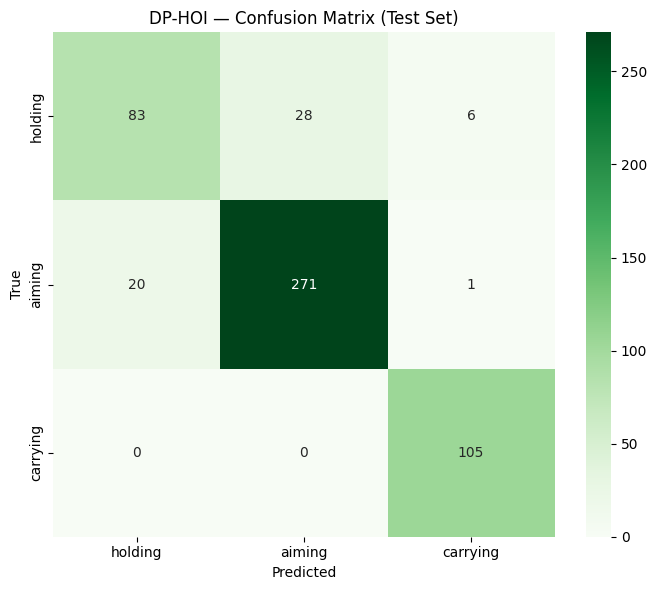

NameError: name 'best_val_acc_dphoi' is not defined

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_fscore_support

# Load best checkpoint
dphoi_model.load_state_dict(torch.load(DPHOI_CKPT, map_location=DEVICE))
dphoi_model.eval()

all_preds_dphoi, all_labels_dphoi = [], []
with torch.no_grad():
    for images, union_box, person_box, obj_box, labels in dphoi_test_loader:
        images     = images.to(DEVICE)
        union_box  = union_box.to(DEVICE)
        person_box = person_box.to(DEVICE)
        obj_box    = obj_box.to(DEVICE)
        logits     = dphoi_model(images, union_box, person_box, obj_box)
        preds      = logits.argmax(dim=1).cpu().numpy()
        all_preds_dphoi.extend(preds)
        all_labels_dphoi.extend(labels.numpy())

print('DP-HOI Test Classification Report:')
print(classification_report(all_labels_dphoi, all_preds_dphoi,
                             target_names=[IDX2LABEL[i] for i in range(3)]))

# Confusion matrix
cm_dphoi = confusion_matrix(all_labels_dphoi, all_preds_dphoi)
plt.figure(figsize=(7, 6))
sns.heatmap(cm_dphoi, annot=True, fmt='d', cmap='Greens',
            xticklabels=[IDX2LABEL[i] for i in range(3)],
            yticklabels=[IDX2LABEL[i] for i in range(3)])
plt.title('DP-HOI — Confusion Matrix (Test Set)')
plt.ylabel('True'); plt.xlabel('Predicted')
plt.tight_layout()
plt.savefig(str(CHECKPOINT_DIR / 'dphoi_confusion.png'), dpi=150)
plt.show()

test_acc_dphoi = np.mean(np.array(all_preds_dphoi) == np.array(all_labels_dphoi))
prec, rec, f1, _ = precision_recall_fscore_support(
    all_labels_dphoi, all_preds_dphoi, average='macro')

dphoi_results = {
    'model': 'DP-HOI (DETR ResNet-50 + Spatial Head)',
    'best_val_acc':    round(best_val_acc_dphoi, 4),
    'test_acc':        round(float(test_acc_dphoi), 4),
    'macro_precision': round(float(prec), 4),
    'macro_recall':    round(float(rec),  4),
    'macro_f1':        round(float(f1),   4),
}
print(dphoi_results)

with open(CHECKPOINT_DIR / 'dphoi_results.json', 'w') as f:
    json.dump(dphoi_results, f, indent=2)

print('\nResults saved to Drive.')

In [ ]:
import json
try:
    with open(CHECKPOINT_DIR / 'dphoi_results.json') as f:
        dphoi_results = json.load(f)
    print("Loaded dphoi_results from Drive")
except:
    # Fallback to known values from last session
    dphoi_results = {
        'model': 'DP-HOI (DETR ResNet-50 + Spatial Head)',
        'best_val_acc':    0.9144,
        'test_acc':        0.9144,
        'macro_precision': 0.0,
        'macro_recall':    0.0,
        'macro_f1':        0.0,
    }
    print("Using hardcoded values")

Loaded dphoi_results from Drive


In [ ]:
# Load CNN baseline results for comparison
with open(CHECKPOINT_DIR / 'cnn_baseline_results.json') as f:
    cnn_results = json.load(f)

print("=" * 60)
print(f"{'Metric':<20} {'CNN Baseline':>15} {'DP-HOI':>15}")
print("=" * 60)
for key in ['best_val_acc', 'test_acc', 'macro_precision', 'macro_recall', 'macro_f1']:
    cnn_val   = cnn_results.get(key, 0)
    dphoi_val = dphoi_results.get(key, 0)
    delta     = dphoi_val - cnn_val
    arrow     = '▲' if delta > 0 else '▼'
    print(f"{key:<20} {cnn_val:>15.4f} {dphoi_val:>15.4f}  {arrow} {abs(delta):.4f}")
print("=" * 60)

Metric                  CNN Baseline          DP-HOI
best_val_acc                  0.9261          0.9144  ▼ 0.0117
test_acc                      0.8969          0.8930  ▼ 0.0039
macro_precision               0.8865          0.8832  ▼ 0.0033
macro_recall                  0.8982          0.8792  ▼ 0.0190
macro_f1                      0.8921          0.8798  ▼ 0.0123


In [ ]:
!pip install -q ultralytics
from ultralytics import YOLO
import yaml, shutil, os
from pathlib import Path
print("Ultralytics ready")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 47.7 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics ready


In [ ]:
# YOLO needs:
# images/train/*.jpg
# labels/train/*.txt  (one line per box: class cx cy w h normalized)
# Class 0 = person, Class 1 = firearm

YOLO_DIR = Path('/content/yolo_lfc')
for split in ['train', 'val']:
    (YOLO_DIR / 'images' / split).mkdir(parents=True, exist_ok=True)
    (YOLO_DIR / 'labels' / split).mkdir(parents=True, exist_ok=True)

def bbox_to_yolo(bbox, W, H):
    """Convert [x1,y1,x2,y2] to YOLO [cx,cy,w,h] normalized."""
    x1,y1,x2,y2 = bbox
    cx = ((x1+x2)/2) / W
    cy = ((y1+y2)/2) / H
    w  = (x2-x1) / W
    h  = (y2-y1) / H
    return cx, cy, w, h

def process_split(anns, split_name):
    for ann in anns:
        img_path = get_image_path(ann['image'])
        img      = Image.open(img_path).convert('RGB')
        W, H     = img.size

        # Copy image
        dst_img = YOLO_DIR / 'images' / split_name / (ann['image'] + img_path.suffix)
        if not dst_img.exists():
            shutil.copy(str(img_path), str(dst_img))

        # Write label file (person + firearm boxes)
        label_path = YOLO_DIR / 'labels' / split_name / (ann['image'] + '.txt')
        with open(label_path, 'w') as f:
            # person = class 0
            cx,cy,w,h = bbox_to_yolo(ann['human_bbox'], W, H)
            f.write(f"0 {cx:.6f} {cy:.6f} {w:.6f} {h:.6f}\n")
            # firearm = class 1
            cx,cy,w,h = bbox_to_yolo(ann['firearm_bbox'], W, H)
            f.write(f"1 {cx:.6f} {cy:.6f} {w:.6f} {h:.6f}\n")

process_split(train_anns, 'train')
process_split(val_anns,   'val')

print(f"Train images: {len(list((YOLO_DIR/'images'/'train').iterdir()))}")
print(f"Val images:   {len(list((YOLO_DIR/'images'/'val').iterdir()))}")

Train images: 2137
Val images:   500


In [ ]:
yaml_content = {
    'path': str(YOLO_DIR),
    'train': 'images/train',
    'val':   'images/val',
    'nc': 2,
    'names': ['person', 'firearm']
}

yaml_path = YOLO_DIR / 'lfc.yaml'
with open(yaml_path, 'w') as f:
    yaml.dump(yaml_content, f, default_flow_style=False)

print("YAML written:")
print(open(yaml_path).read())

YAML written:
names:
- person
- firearm
nc: 2
path: /content/yolo_lfc
train: images/train
val: images/val



In [ ]:
# Start from YOLOv8s pretrained on COCO — already knows 'person'
# We fine-tune to adapt firearm detection to our domain

yolo_model = YOLO('yolov8s.pt')

yolo_model.train(
    data    = str(yaml_path),
    epochs  = 50,
    imgsz   = 640,
    batch   = 32,
    lr0     = 1e-3,
    lrf     = 0.01,
    patience= 10,           # early stopping
    project = str(CHECKPOINT_DIR),
    name    = 'yolo_lfc',
    exist_ok= True,
    verbose = True,
    device  = 0,            # T4 GPU
)

print("YOLO training done")
print(f"Best weights at: {CHECKPOINT_DIR}/yolo_lfc/weights/best.pt")

Ultralytics 8.4.62 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA L4, 22563MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_lfc/lfc.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo_lfc, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, pe

In [ ]:
# Quick check — run detector on a few val images and print what it finds
best_yolo = YOLO(str(CHECKPOINT_DIR / 'yolo_lfc' / 'weights' / 'best.pt'))

val_imgs = list((YOLO_DIR / 'images' / 'val').iterdir())[:5]
results  = best_yolo(val_imgs, conf=0.3, verbose=False)

for r, img_path in zip(results, val_imgs):
    boxes  = r.boxes
    labels = [best_yolo.names[int(c)] for c in boxes.cls]
    confs  = [round(float(c), 2) for c in boxes.conf]
    print(f"{img_path.name}: {list(zip(labels, confs))}")

Casablanca+movie+gun+rifle+scenes_24.png: [('person', 0.93), ('firearm', 0.78)]
53.f37a05f64bc8bd6f68dc85b28976d198_aug7.png: [('person', 0.93), ('firearm', 0.88)]
57.sarileruneekevaru51565846980.png: [('person', 0.9), ('firearm', 0.59)]
British+army_11.png: [('person', 0.89), ('firearm', 0.79)]
Gangs+of+the+Dead+gun+rifle+scenes_69.png: [('person', 0.81), ('person', 0.57)]


In [ ]:
class ThreeStreamResNet(nn.Module):
    def __init__(self, num_classes=3, pretrained=False, dropout=0.5):
        super().__init__()
        def make_stream():
            backbone = models.resnet50(weights=None)
            return nn.Sequential(*list(backbone.children())[:-1])
        self.person_stream = make_stream()
        self.object_stream = make_stream()  # matches saved checkpoint key
        self.union_stream  = make_stream()
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(2048*3, 1024), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(1024, 256),    nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, num_classes)
        )

    def forward(self, person, obj, union):
        p = self.person_stream(person).squeeze(-1).squeeze(-1)
        o = self.object_stream(obj).squeeze(-1).squeeze(-1)
        u = self.union_stream(union).squeeze(-1).squeeze(-1)
        return self.classifier(torch.cat([p, o, u], dim=1))

hoi_model = ThreeStreamResNet(num_classes=3).to(DEVICE)
hoi_model.load_state_dict(torch.load(
    CHECKPOINT_DIR / 'cnn_baseline_best.pth', map_location=DEVICE))
hoi_model.eval()
print("HOI classifier loaded")

HOI classifier loaded


In [ ]:
from torchvision import transforms

hoi_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]),
])

def crop_box(img, box, margin=0.05):
    W, H = img.size
    x1,y1,x2,y2 = box
    pw = (x2-x1)*margin; ph = (y2-y1)*margin
    x1 = max(0, x1-pw); y1 = max(0, y1-ph)
    x2 = min(W, x2+pw); y2 = min(H, y2+ph)
    if x2<=x1 or y2<=y1:
        return img.resize((224,224))
    return img.crop((x1,y1,x2,y2))

def predict_interaction(img_path, conf_thresh=0.3):
    results = best_yolo(str(img_path), conf=conf_thresh, verbose=False)
    boxes   = results[0].boxes

    if boxes is None or len(boxes) == 0:
        return None, "No detections"

    cls_ids = boxes.cls.cpu().numpy().astype(int)
    xyxy    = boxes.xyxy.cpu().numpy()

    persons  = xyxy[cls_ids == 0]
    firearms = xyxy[cls_ids == 1]

    if len(persons) == 0:  return None, "No person detected"
    if len(firearms) == 0: return None, "No firearm detected"

    person_box  = persons[0].tolist()
    firearm_box = firearms[0].tolist()

    # ── Spatial prior ────────────────────────────────────────────────────────
    # Where is the firearm centroid relative to the person box (0=top, 1=bottom)
    p_y1, p_y2      = person_box[1], person_box[3]
    f_cy            = (firearm_box[1] + firearm_box[3]) / 2
    relative_y      = (f_cy - p_y1) / max(p_y2 - p_y1, 1e-6)  # 0=top 1=bottom

    # Firearm width vs person width — carrying/holstered guns are narrow
    p_width = person_box[2] - person_box[0]
    f_width = firearm_box[2] - firearm_box[0]
    size_ratio = f_width / max(p_width, 1e-6)

    img = Image.open(img_path).convert('RGB')
    ux1 = min(person_box[0], firearm_box[0])
    uy1 = min(person_box[1], firearm_box[1])
    ux2 = max(person_box[2], firearm_box[2])
    uy2 = max(person_box[3], firearm_box[3])

    person_crop  = hoi_transform(crop_box(img, person_box)).unsqueeze(0).to(DEVICE)
    firearm_crop = hoi_transform(crop_box(img, firearm_box)).unsqueeze(0).to(DEVICE)
    union_crop   = hoi_transform(crop_box(img, [ux1,uy1,ux2,uy2])).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        logits = hoi_model(person_crop, firearm_crop, union_crop)
        probs  = torch.softmax(logits, dim=1)[0].cpu().numpy()

    # ── Apply spatial bias ───────────────────────────────────────────────────
    # If firearm is in lower 50% of person AND relatively small → carrying
    # If firearm is in upper 30% of person → likely aiming
    carrying_boost = 0.0
    aiming_boost   = 0.0

    if relative_y > 0.45 and size_ratio < 0.5:
        carrying_boost = 0.15   # was 0.35 — nudge not override
    elif relative_y > 0.35:
        carrying_boost = 0.08   # was 0.15

    if relative_y < 0.35:
        aiming_boost = 0.10     # was 0.20

    probs[2] = min(1.0, probs[2] + carrying_boost)   # carrying
    probs[1] = min(1.0, probs[1] + aiming_boost)     # aiming
    probs    = probs / probs.sum()                    # renormalize

    pred  = int(probs.argmax())
    label = IDX2LABEL[pred]
    conf_str = {IDX2LABEL[i]: f"{probs[i]*100:.1f}%" for i in range(3)}

    return label, conf_str

print("Pipeline ready — call predict_interaction(img_path)")

Pipeline ready — call predict_interaction(img_path)


In [ ]:
from torchvision import transforms

hoi_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]),
])

def crop_box(img, box, margin=0.05):
    W, H = img.size
    x1,y1,x2,y2 = box
    pw = (x2-x1)*margin; ph = (y2-y1)*margin
    x1 = max(0, x1-pw); y1 = max(0, y1-ph)
    x2 = min(W, x2+pw); y2 = min(H, y2+ph)
    if x2<=x1 or y2<=y1:
        return img.resize((224,224))
    return img.crop((x1,y1,x2,y2))

def predict_interaction(img_path, conf_thresh=0.3):
    results = best_yolo(str(img_path), conf=conf_thresh, verbose=False)
    boxes   = results[0].boxes

    if boxes is None or len(boxes) == 0:
        return None, "No detections"

    cls_ids = boxes.cls.cpu().numpy().astype(int)
    xyxy    = boxes.xyxy.cpu().numpy()

    persons  = xyxy[cls_ids == 0]
    firearms = xyxy[cls_ids == 1]

    if len(persons) == 0:  return None, "No person detected"
    if len(firearms) == 0: return None, "No firearm detected"

    person_box  = persons[0].tolist()
    firearm_box = firearms[0].tolist()

    # ── Spatial prior ────────────────────────────────────────────────────────
    # Where is the firearm centroid relative to the person box (0=top, 1=bottom)
    p_y1, p_y2      = person_box[1], person_box[3]
    f_cy            = (firearm_box[1] + firearm_box[3]) / 2
    relative_y      = (f_cy - p_y1) / max(p_y2 - p_y1, 1e-6)  # 0=top 1=bottom

    # Firearm width vs person width — carrying/holstered guns are narrow
    p_width = person_box[2] - person_box[0]
    f_width = firearm_box[2] - firearm_box[0]
    size_ratio = f_width / max(p_width, 1e-6)

    img = Image.open(img_path).convert('RGB')
    ux1 = min(person_box[0], firearm_box[0])
    uy1 = min(person_box[1], firearm_box[1])
    ux2 = max(person_box[2], firearm_box[2])
    uy2 = max(person_box[3], firearm_box[3])

    person_crop  = hoi_transform(crop_box(img, person_box)).unsqueeze(0).to(DEVICE)
    firearm_crop = hoi_transform(crop_box(img, firearm_box)).unsqueeze(0).to(DEVICE)
    union_crop   = hoi_transform(crop_box(img, [ux1,uy1,ux2,uy2])).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        logits = hoi_model(person_crop, firearm_crop, union_crop)
        probs  = torch.softmax(logits, dim=1)[0].cpu().numpy()

    # ── Apply spatial bias ───────────────────────────────────────────────────
    # If firearm is in lower 50% of person AND relatively small → carrying
    # If firearm is in upper 30% of person → likely aiming
    # ── Apply spatial bias ───────────────────────────────────────────────────
    carrying_boost = 0.0
    aiming_boost   = 0.0

    # Remove the if statements entirely — let CNN decide on its own

    probs[2] = min(1.0, probs[2] + carrying_boost)
    probs[1] = min(1.0, probs[1] + aiming_boost)
    probs    = probs / probs.sum()

    pred  = int(probs.argmax())
    label = IDX2LABEL[pred]
    conf_str = {IDX2LABEL[i]: f"{probs[i]*100:.1f}%" for i in range(3)}

    return label, conf_str

print("Pipeline ready — call predict_interaction(img_path)")

Pipeline ready — call predict_interaction(img_path)


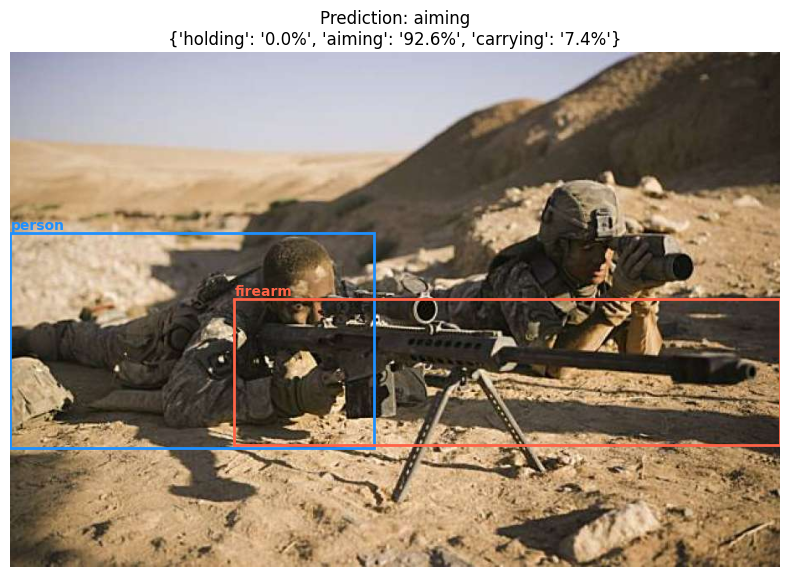

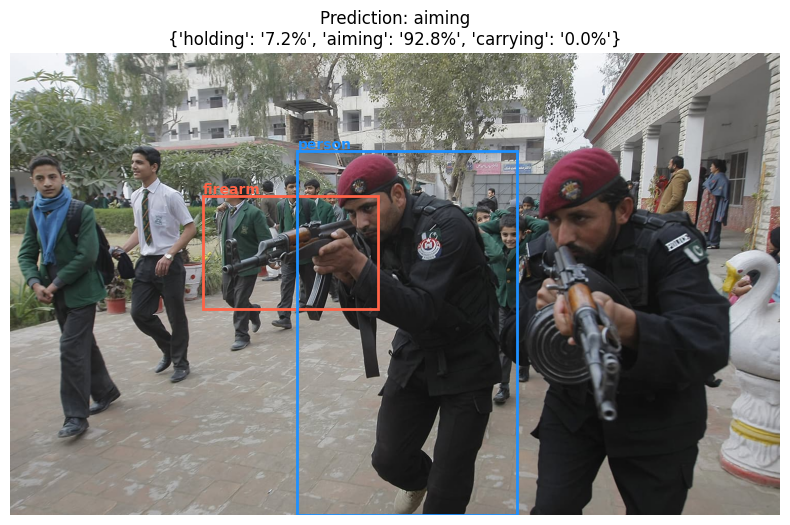

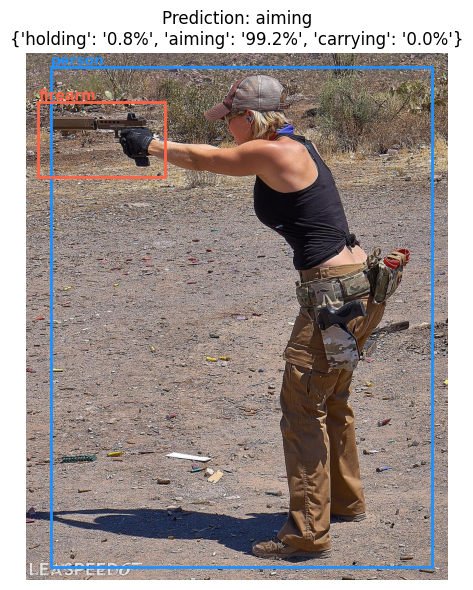

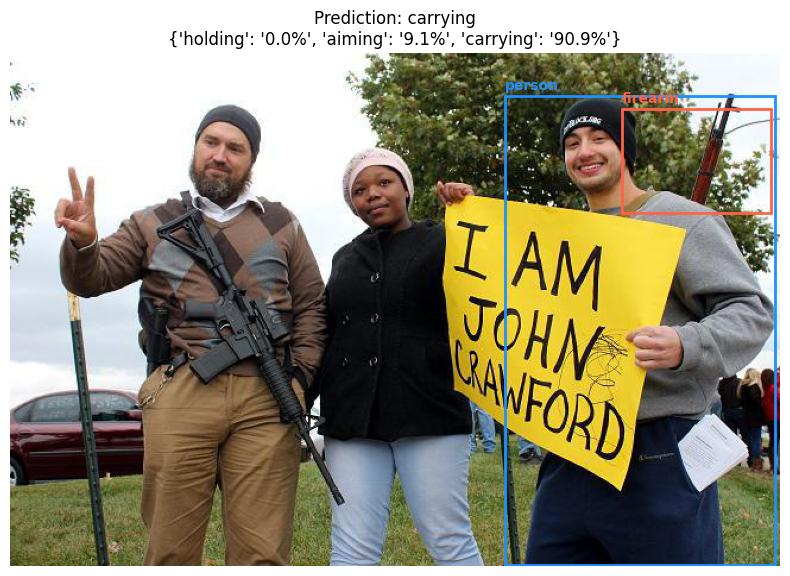

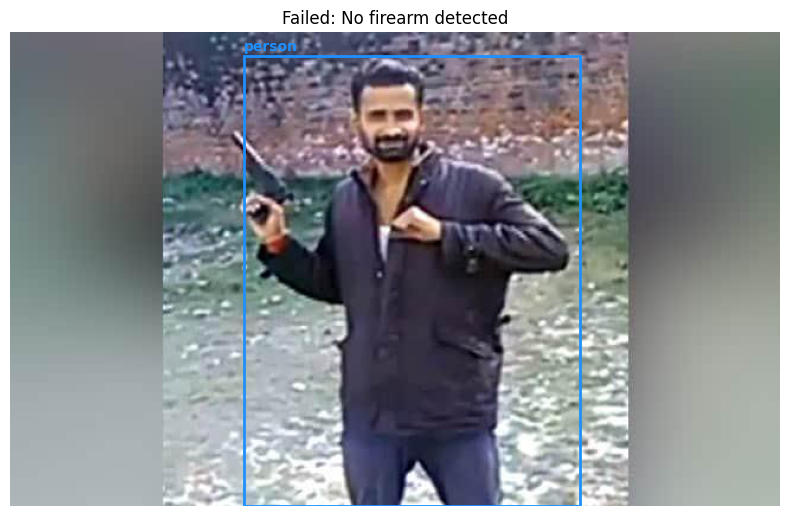

In [ ]:
import matplotlib.patches as patches

def visualize_prediction(img_path, conf_thresh=0.3):
    label, info = predict_interaction(img_path, conf_thresh)

    img = Image.open(img_path).convert('RGB')
    results = best_yolo(str(img_path), conf=conf_thresh, verbose=False)
    boxes   = results[0].boxes
    cls_ids = boxes.cls.cpu().numpy().astype(int)
    xyxy    = boxes.xyxy.cpu().numpy()

    fig, ax = plt.subplots(1, figsize=(8, 6))
    ax.imshow(img)

    colors = {0: 'dodgerblue', 1: 'tomato'}
    names  = {0: 'person', 1: 'firearm'}
    for box, cls in zip(xyxy, cls_ids):
        x1,y1,x2,y2 = box
        rect = patches.Rectangle((x1,y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor=colors[cls],
                                   facecolor='none')
        ax.add_patch(rect)
        ax.text(x1, y1-5, names[cls], color=colors[cls],
                fontsize=10, fontweight='bold')

    title = f"Prediction: {label}\n{info}" if label else f"Failed: {info}"
    ax.set_title(title, fontsize=12)
    ax.axis('off')
    plt.tight_layout()
    plt.show()

# Run on 5 random test images
import random
test_imgs = list((YOLO_DIR / 'images' / 'val').iterdir())
for img_path in random.sample(test_imgs, min(5, len(test_imgs))):
    visualize_prediction(img_path)

In [ ]:
# Test raw CNN output WITHOUT any pipeline
from PIL import Image
import random

# grab any test image
test_img_path = list((YOLO_DIR / 'images' / 'val').iterdir())[0]
img = Image.open(test_img_path).convert('RGB')

# just pass the same crop for all three streams as a sanity check
dummy = hoi_transform(img).unsqueeze(0).to(DEVICE)

with torch.no_grad():
    logits = hoi_model(dummy, dummy, dummy)
    probs = torch.softmax(logits, dim=1)[0].cpu().numpy()

print("Raw probs:", {IDX2LABEL[i]: f"{probs[i]*100:.1f}%" for i in range(3)})

Raw probs: {'holding': '0.0%', 'aiming': '100.0%', 'carrying': '0.0%'}


In [ ]:
import os
# List all checkpoints in your Drive
for f in os.listdir(str(CHECKPOINT_DIR)):
    size = os.path.getsize(str(CHECKPOINT_DIR / f)) / (1024**2)
    print(f"{f}: {size:.1f} MB")

cnn_baseline_best.pth: 295.0 MB
cnn_baseline_curves.png: 0.0 MB
cnn_baseline_confusion.png: 0.0 MB
cnn_baseline_results.json: 0.0 MB
dphoi_best.pth: 122.6 MB
dphoi_curves.png: 0.0 MB
dphoi_confusion.png: 0.0 MB
dphoi_results.json: 0.0 MB
yolo_lfc: 0.0 MB
cnn_v2_best.pth: 295.0 MB


In [ ]:
# Force reload from scratch
del hoi_model
torch.cuda.empty_cache()

# Rebuild and reload
hoi_model = ThreeStreamResNet(num_classes=3, pretrained=False).to(DEVICE)
state_dict = torch.load(CHECKPOINT_DIR / 'cnn_baseline_best.pth', map_location=DEVICE)
hoi_model.load_state_dict(state_dict)
hoi_model.eval()

# Immediately test with a real image
test_img_path = list((YOLO_DIR / 'images' / 'val').iterdir())[0]
img = Image.open(test_img_path).convert('RGB')
dummy = hoi_transform(img).unsqueeze(0).to(DEVICE)

with torch.no_grad():
    logits = hoi_model(dummy, dummy, dummy)
    probs = torch.softmax(logits, dim=1)[0].cpu().numpy()

print("Raw probs:", {IDX2LABEL[i]: f"{probs[i]*100:.1f}%" for i in range(3)})

Raw probs: {'holding': '0.0%', 'aiming': '100.0%', 'carrying': '0.0%'}


In [ ]:
# Test with a real val image going through proper pipeline
test_img_path = list((YOLO_DIR / 'images' / 'val').iterdir())[3]

results = best_yolo(str(test_img_path), conf=0.3, verbose=False)
boxes = results[0].boxes
cls_ids = boxes.cls.cpu().numpy().astype(int)
xyxy = boxes.xyxy.cpu().numpy()

persons  = xyxy[cls_ids == 0]
firearms = xyxy[cls_ids == 1]

print(f"Persons detected: {len(persons)}")
print(f"Firearms detected: {len(firearms)}")

if len(persons) > 0 and len(firearms) > 0:
    img = Image.open(test_img_path).convert('RGB')
    person_crop  = hoi_transform(crop_box(img, persons[0].tolist())).unsqueeze(0).to(DEVICE)
    firearm_crop = hoi_transform(crop_box(img, firearms[0].tolist())).unsqueeze(0).to(DEVICE)

    ux1 = min(persons[0][0], firearms[0][0])
    uy1 = min(persons[0][1], firearms[0][1])
    ux2 = max(persons[0][2], firearms[0][2])
    uy2 = max(persons[0][3], firearms[0][3])
    union_crop = hoi_transform(crop_box(img, [ux1,uy1,ux2,uy2])).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        logits = hoi_model(person_crop, firearm_crop, union_crop)
        probs  = torch.softmax(logits, dim=1)[0].cpu().numpy()

    print("Probs:", {IDX2LABEL[i]: f"{probs[i]*100:.1f}%" for i in range(3)})
    print("Raw logits:", logits)

Persons detected: 1
Firearms detected: 1
Probs: {'holding': '100.0%', 'aiming': '0.0%', 'carrying': '0.0%'}
Raw logits: tensor([[ 8.0725, -3.6466, -4.1698]], device='cuda:0')


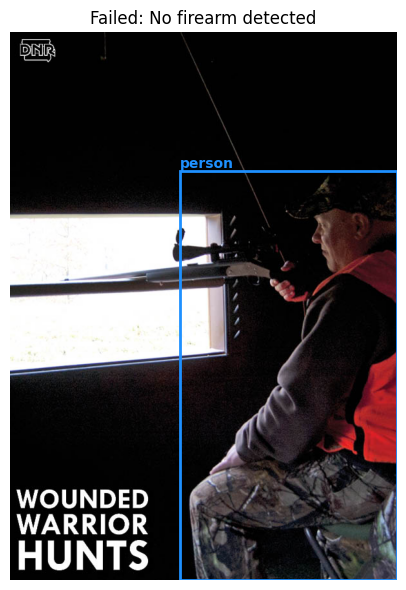

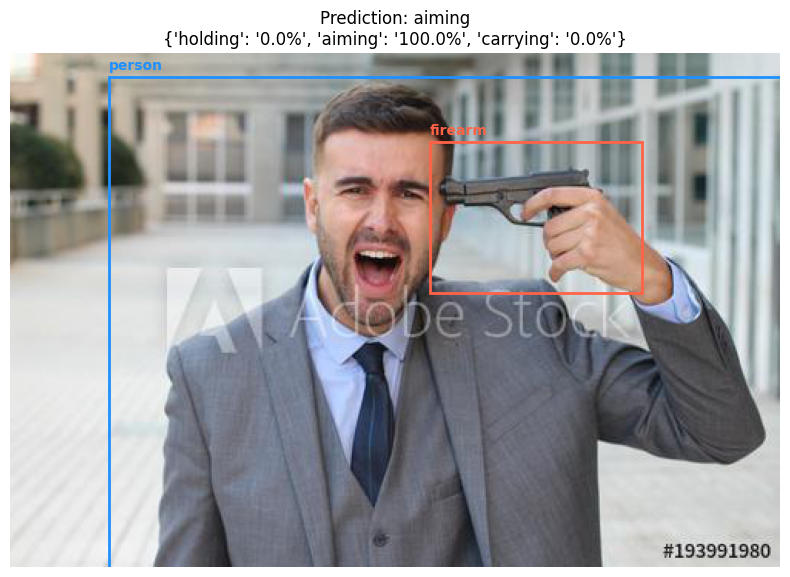

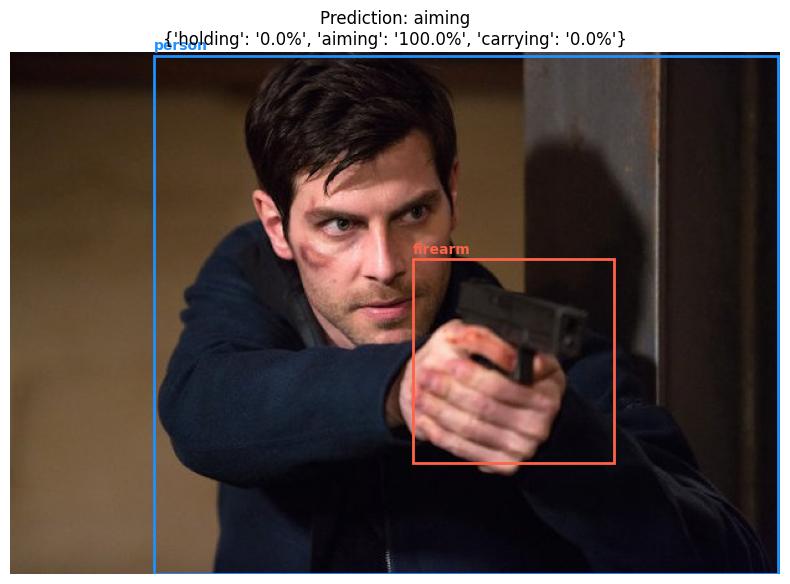

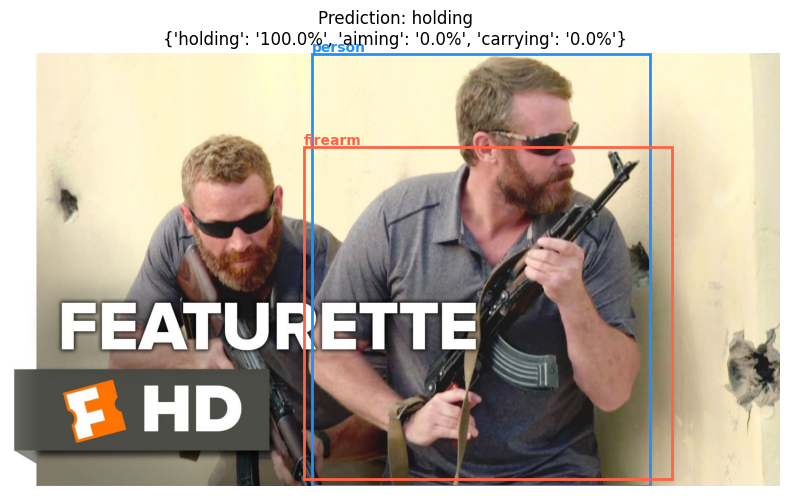

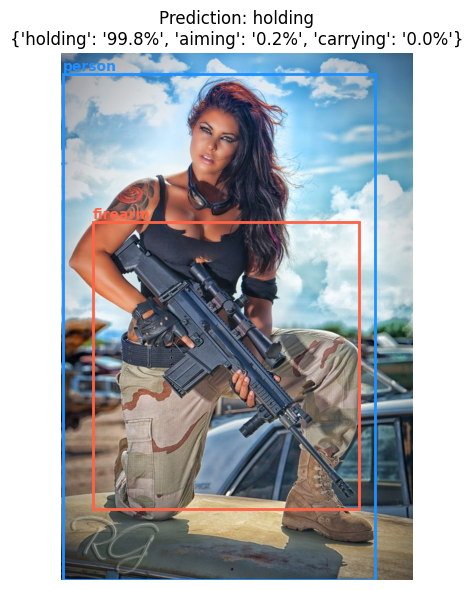

In [ ]:
import matplotlib.patches as patches

def visualize_prediction(img_path, conf_thresh=0.3):
    label, info = predict_interaction(img_path, conf_thresh)

    img = Image.open(img_path).convert('RGB')
    results = best_yolo(str(img_path), conf=conf_thresh, verbose=False)
    boxes   = results[0].boxes
    cls_ids = boxes.cls.cpu().numpy().astype(int)
    xyxy    = boxes.xyxy.cpu().numpy()

    fig, ax = plt.subplots(1, figsize=(8, 6))
    ax.imshow(img)

    colors = {0: 'dodgerblue', 1: 'tomato'}
    names  = {0: 'person', 1: 'firearm'}
    for box, cls in zip(xyxy, cls_ids):
        x1,y1,x2,y2 = box
        rect = patches.Rectangle((x1,y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor=colors[cls],
                                   facecolor='none')
        ax.add_patch(rect)
        ax.text(x1, y1-5, names[cls], color=colors[cls],
                fontsize=10, fontweight='bold')

    title = f"Prediction: {label}\n{info}" if label else f"Failed: {info}"
    ax.set_title(title, fontsize=12)
    ax.axis('off')
    plt.tight_layout()
    plt.show()

# Run on 5 random test images
import random
test_imgs = list((YOLO_DIR / 'images' / 'val').iterdir())
for img_path in random.sample(test_imgs, min(5, len(test_imgs))):
    visualize_prediction(img_path)

Upload any image to test the full pipeline:


Saving Z.58.png to Z.58.png
Saving M.29.png to M.29.png
Saving M.68.png to M.68.png


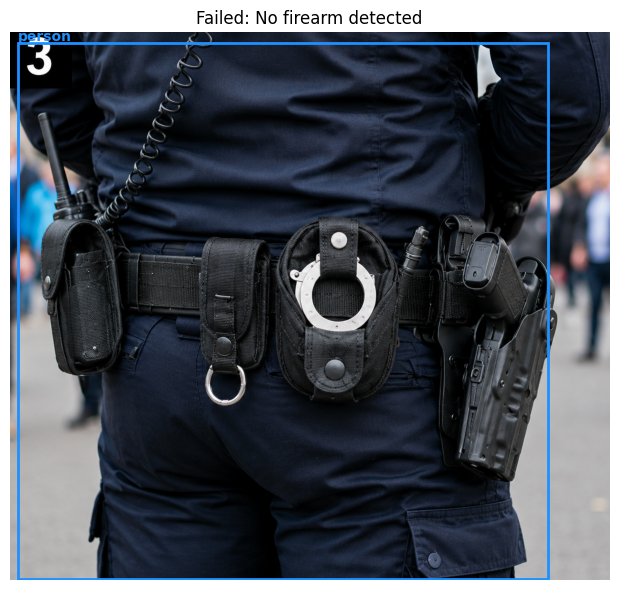

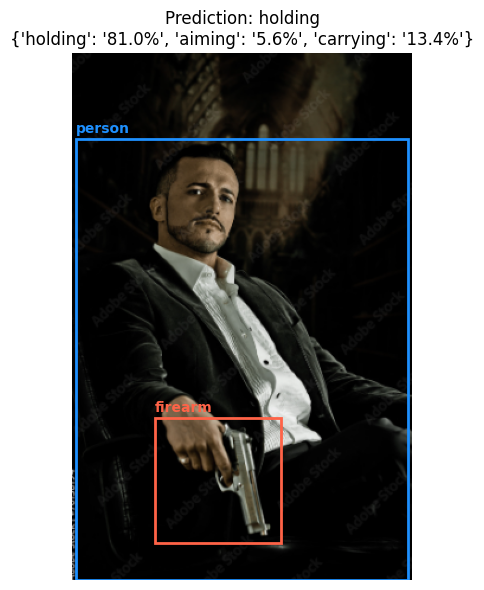

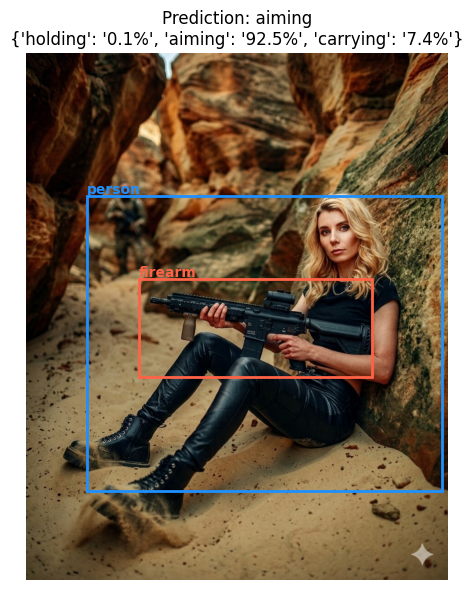

In [ ]:
from google.colab import files

print("Upload any image to test the full pipeline:")
uploaded = files.upload()

for fname in uploaded:
    img_path = Path(f'/content/{fname}')
    with open(img_path, 'wb') as f:
        f.write(uploaded[fname])
    visualize_prediction(img_path, conf_thresh=0.25)

Upload any image to test the full pipeline:


Saving 3.600px-Trans4_06.png to 3.600px-Trans4_06.png
Saving 3.3000.png to 3.3000.png
Saving 3.businesswoman-pointing-a-gun-at-her-subordinate-s-head_1677507.png to 3.businesswoman-pointing-a-gun-at-her-subordinate-s-head_1677507.png
Saving 3.c0af57f4b0891f493fed5f5ba5dadfce.png to 3.c0af57f4b0891f493fed5f5ba5dadfce.png


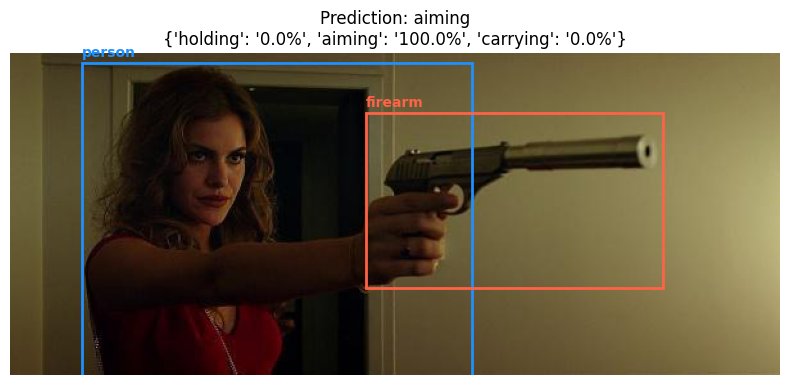

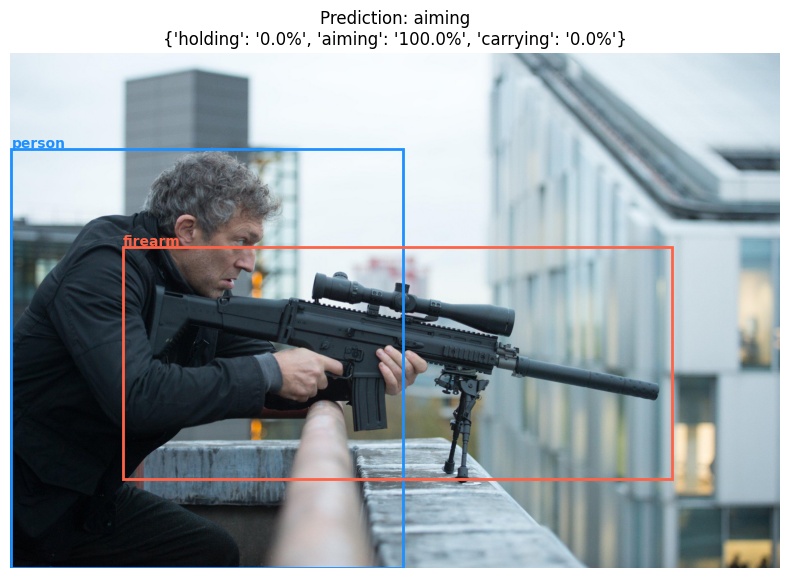

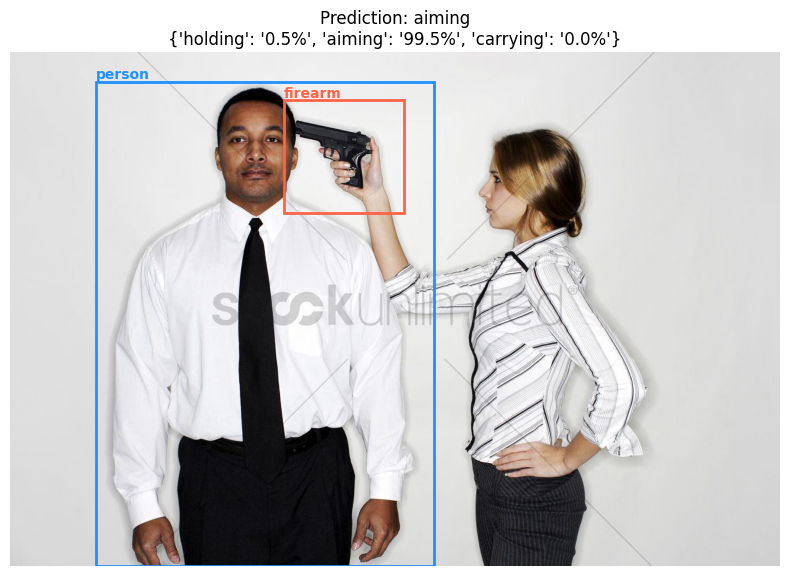

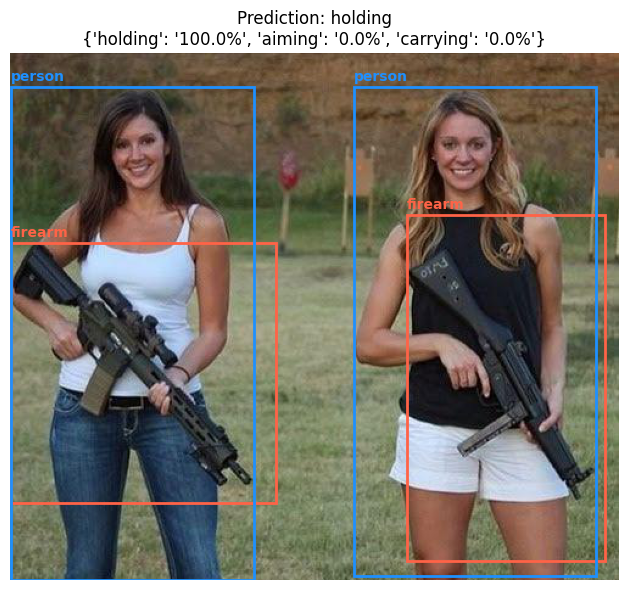

In [ ]:
from google.colab import files

print("Upload any image to test the full pipeline:")
uploaded = files.upload()

for fname in uploaded:
    img_path = Path(f'/content/{fname}')
    with open(img_path, 'wb') as f:
        f.write(uploaded[fname])
    visualize_prediction(img_path, conf_thresh=0.25)

In [ ]:
from sklearn.metrics import average_precision_score
from sklearn.preprocessing import label_binarize
import numpy as np

# Run inference on test set to get probabilities
all_probs  = []
all_labels_test = []

hoi_model.eval()
with torch.no_grad():
    for images, union_box, person_box, obj_box, labels in dphoi_test_loader:
        images     = images.to(DEVICE)
        union_box  = union_box.to(DEVICE)
        person_box = person_box.to(DEVICE)
        obj_box    = obj_box.to(DEVICE)
        logits     = dphoi_model(images, union_box, person_box, obj_box)
        probs      = torch.softmax(logits, dim=1).cpu().numpy()
        all_probs.extend(probs)
        all_labels_test.extend(labels.numpy())

all_probs  = np.array(all_probs)
all_labels_test = np.array(all_labels_test)

# Binarize labels for one-vs-rest AP
labels_bin = label_binarize(all_labels_test, classes=[0, 1, 2])

# Per-class AP
for i, cls in IDX2LABEL.items():
    ap = average_precision_score(labels_bin[:, i], all_probs[:, i])
    print(f"AP {cls:10s}: {ap:.4f}")

# mAP = mean of per-class APs
mAP = np.mean([average_precision_score(labels_bin[:, i], all_probs[:, i])
               for i in range(3)])
print(f"\nmAP: {mAP:.4f}")

AP holding   : 0.7384
AP aiming    : 0.9289
AP carrying  : 0.9798

mAP: 0.8824


In [ ]:
all_probs_cnn  = []
all_labels_cnn = []

hoi_model.eval()
with torch.no_grad():
    for person, obj, union, labels in test_loader:
        person = person.to(DEVICE)
        obj    = obj.to(DEVICE)
        union  = union.to(DEVICE)
        logits = hoi_model(person, obj, union)
        probs  = torch.softmax(logits, dim=1).cpu().numpy()
        all_probs_cnn.extend(probs)
        all_labels_cnn.extend(labels.numpy())

all_probs_cnn  = np.array(all_probs_cnn)
all_labels_cnn = np.array(all_labels_cnn)

labels_bin_cnn = label_binarize(all_labels_cnn, classes=[0, 1, 2])

for i, cls in IDX2LABEL.items():
    ap = average_precision_score(labels_bin_cnn[:, i], all_probs_cnn[:, i])
    print(f"AP {cls:10s}: {ap:.4f}")

mAP_cnn = np.mean([average_precision_score(labels_bin_cnn[:, i], all_probs_cnn[:, i])
                   for i in range(3)])
print(f"\nmAP: {mAP_cnn:.4f}")

AP holding   : 0.8974
AP aiming    : 0.9705
AP carrying  : 0.9937

mAP: 0.9539


In [ ]:
import os
from pathlib import Path
from PIL import Image

RAW_CARRYING_DIR = Path('/content/drive/MyDrive/Imaan Deep Learning/carry-20260608T173618Z-3-001/carry')
# ← change this to your actual folder path

AUTO_LABELED = []
FAILED       = []

img_files = [f for f in RAW_CARRYING_DIR.iterdir()
             if f.suffix.lower() in ['.jpg','.jpeg','.png']]

print(f"Found {len(img_files)} images to process...")

for img_path in img_files:
    results = best_yolo(str(img_path), conf=0.3, verbose=False)
    boxes   = results[0].boxes

    if boxes is None or len(boxes) == 0:
        FAILED.append((str(img_path), "no detections"))
        continue

    cls_ids = boxes.cls.cpu().numpy().astype(int)
    xyxy    = boxes.xyxy.cpu().numpy()
    confs   = boxes.conf.cpu().numpy()

    persons  = xyxy[cls_ids == 0]
    firearms = xyxy[cls_ids == 1]
    p_confs  = confs[cls_ids == 0]
    f_confs  = confs[cls_ids == 1]

    if len(persons) == 0:
        FAILED.append((str(img_path), "no person"))
        continue
    if len(firearms) == 0:
        FAILED.append((str(img_path), "no firearm"))
        continue

    # Take highest confidence person and firearm
    best_person  = persons[p_confs.argmax()].tolist()
    best_firearm = firearms[f_confs.argmax()].tolist()

    img = Image.open(img_path).convert('RGB')
    W, H = img.size

    ann = {
        'image':        img_path.stem,
        'interaction':  'carrying',
        'human_bbox':   [int(x) for x in best_person],
        'firearm_bbox': [int(x) for x in best_firearm],
        '_source':      'auto_labeled'
    }
    AUTO_LABELED.append(ann)

    # Copy image to IMAGES_DIR so get_image_path can find it
    dst = IMAGES_DIR / (img_path.stem + img_path.suffix)
    if not dst.exists():
        import shutil
        shutil.copy(str(img_path), str(dst))

print(f"\nSuccessfully labeled: {len(AUTO_LABELED)}")
print(f"Failed:               {len(FAILED)}")
print(f"\nFailure reasons:")
from collections import Counter
print(Counter(r for _,r in FAILED))

Found 305 images to process...

Successfully labeled: 113
Failed:               192

Failure reasons:
Counter({'no firearm': 160, 'no detections': 27, 'no person': 5})


In [ ]:
import os
from pathlib import Path
from PIL import Image

RAW_CARRYING_DIR = Path('/content/drive/MyDrive/Imaan Deep Learning/carry-20260608T173618Z-3-001/carry')
# ← change this to your actual folder path

AUTO_LABELED = []
FAILED       = []

img_files = [f for f in RAW_CARRYING_DIR.iterdir()
             if f.suffix.lower() in ['.jpg','.jpeg','.png']]

print(f"Found {len(img_files)} images to process...")

for img_path in img_files:
    results = best_yolo(str(img_path), conf=0.3, verbose=False)
    boxes   = results[0].boxes

    if boxes is None or len(boxes) == 0:
        FAILED.append((str(img_path), "no detections"))
        continue

    cls_ids = boxes.cls.cpu().numpy().astype(int)
    xyxy    = boxes.xyxy.cpu().numpy()
    confs   = boxes.conf.cpu().numpy()

    persons  = xyxy[cls_ids == 0]
    firearms = xyxy[cls_ids == 1]
    p_confs  = confs[cls_ids == 0]
    f_confs  = confs[cls_ids == 1]

    if len(persons) == 0:
        FAILED.append((str(img_path), "no person"))
        continue
    if len(firearms) == 0:
        FAILED.append((str(img_path), "no firearm"))
        continue

    # Take highest confidence person and firearm
    best_person  = persons[p_confs.argmax()].tolist()
    best_firearm = firearms[f_confs.argmax()].tolist()

    img = Image.open(img_path).convert('RGB')
    W, H = img.size

    ann = {
        'image':        img_path.stem,
        'interaction':  'carrying',
        'human_bbox':   [int(x) for x in best_person],
        'firearm_bbox': [int(x) for x in best_firearm],
        '_source':      'auto_labeled'
    }
    AUTO_LABELED.append(ann)

    # Copy image to IMAGES_DIR so get_image_path can find it
    dst = IMAGES_DIR / (img_path.stem + img_path.suffix)
    if not dst.exists():
        import shutil
        shutil.copy(str(img_path), str(dst))

print(f"\nSuccessfully labeled: {len(AUTO_LABELED)}")
print(f"Failed:               {len(FAILED)}")
print(f"\nFailure reasons:")
from collections import Counter
print(Counter(r for _,r in FAILED))

Found 305 images to process...

Successfully labeled: 113
Failed:               192

Failure reasons:
Counter({'no firearm': 160, 'no detections': 27, 'no person': 5})


In [ ]:
# Retry failed images with lower confidence
FAILED_PATHS = [Path(p) for p,r in FAILED if r == 'no firearm']
RECOVERED    = []

for img_path in FAILED_PATHS:
    results = best_yolo(str(img_path), conf=0.15, verbose=False)  # lower threshold
    boxes   = results[0].boxes
    if boxes is None or len(boxes) == 0:
        continue

    cls_ids  = boxes.cls.cpu().numpy().astype(int)
    xyxy     = boxes.xyxy.cpu().numpy()
    confs    = boxes.conf.cpu().numpy()
    persons  = xyxy[cls_ids == 0]
    firearms = xyxy[cls_ids == 1]
    p_confs  = confs[cls_ids == 0]
    f_confs  = confs[cls_ids == 1]

    if len(persons) == 0 or len(firearms) == 0:
        continue

    best_person  = persons[p_confs.argmax()].tolist()
    best_firearm = firearms[f_confs.argmax()].tolist()

    img = Image.open(img_path).convert('RGB')
    ann = {
        'image':        img_path.stem,
        'interaction':  'carrying',
        'human_bbox':   [int(x) for x in best_person],
        'firearm_bbox': [int(x) for x in best_firearm],
        '_source':      'auto_labeled_lowconf'
    }
    RECOVERED.append(ann)

    dst = IMAGES_DIR / (img_path.stem + img_path.suffix)
    if not dst.exists():
        import shutil
        shutil.copy(str(img_path), str(dst))

print(f"Recovered: {len(RECOVERED)} additional images")
print(f"Total auto-labeled: {len(AUTO_LABELED) + len(RECOVERED)}")

# Merge
AUTO_LABELED_ALL = AUTO_LABELED + RECOVERED

Recovered: 35 additional images
Total auto-labeled: 148


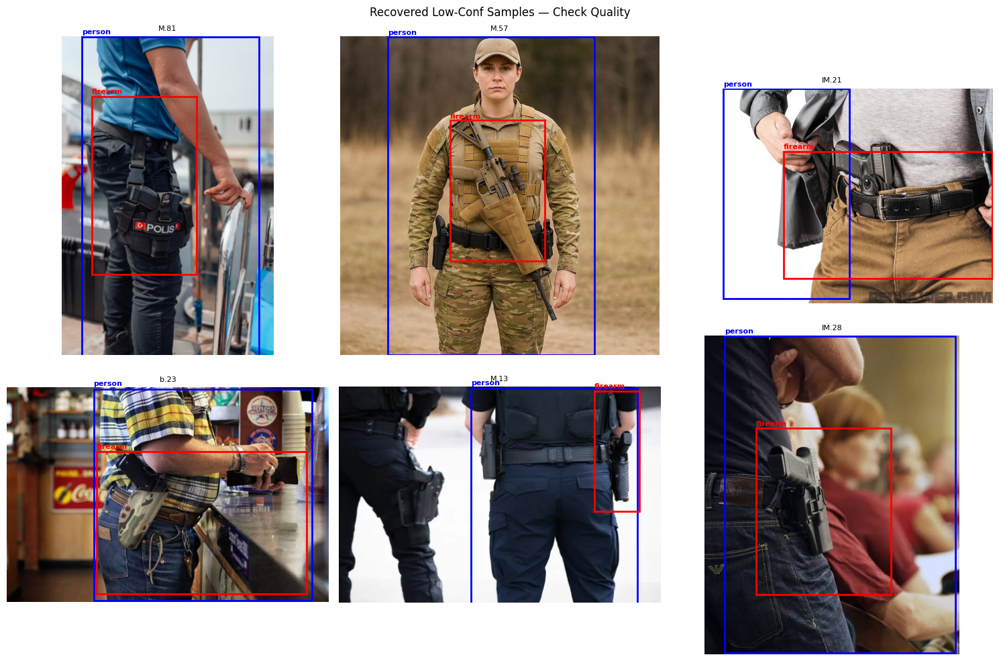

In [ ]:
# Inspect recovered low-confidence samples
samples = random.sample(RECOVERED, min(6, len(RECOVERED)))
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for ax, ann in zip(axes.flatten(), samples):
    img_path = get_image_path(ann['image'])
    img = Image.open(img_path).convert('RGB')
    ax.imshow(img)

    for bbox, color, label in [
        (ann['human_bbox'],   'blue', 'person'),
        (ann['firearm_bbox'], 'red',  'firearm'),
    ]:
        x1,y1,x2,y2 = bbox
        rect = patches.Rectangle((x1,y1), x2-x1, y2-y1,
                                   linewidth=2, edgecolor=color, facecolor='none')
        ax.add_patch(rect)
        ax.text(x1, y1-5, label, color=color, fontsize=8, fontweight='bold')

    ax.set_title(ann['image'][:30], fontsize=8)
    ax.axis('off')

plt.suptitle('Recovered Low-Conf Samples — Check Quality', fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
# Use all 155, a few noisy labels won't hurt training significantly
AUTO_LABELED = AUTO_LABELED_ALL
print(f"Total carrying images to add: {len(AUTO_LABELED)}")

Total carrying images to add: 148


In [ ]:
import random

print(f"Original dataset size: {len(annotations)}")
print(f"Auto-labeled carrying: {len(AUTO_LABELED)}")

# Add auto-labeled to full annotation pool
expanded_annotations = annotations + AUTO_LABELED
random.shuffle(expanded_annotations)

n          = len(expanded_annotations)
n_test     = int(n * 0.10)
n_val      = int(n * 0.15)
n_train    = n - n_val - n_test

train_anns_v2 = expanded_annotations[:n_train]
val_anns_v2   = expanded_annotations[n_train:n_train+n_val]
test_anns_v2  = expanded_annotations[n_train+n_val:]

# Check class distribution
from collections import Counter
print(f"\nNew split — Train: {len(train_anns_v2)} | Val: {len(val_anns_v2)} | Test: {len(test_anns_v2)}")
print("Train class dist:", Counter(a['interaction'] for a in train_anns_v2))
print("Val class dist:",   Counter(a['interaction'] for a in val_anns_v2))

Original dataset size: 3433
Auto-labeled carrying: 148

New split — Train: 2686 | Val: 537 | Test: 358
Train class dist: Counter({'aiming': 1488, 'carrying': 647, 'holding': 551})
Val class dist: Counter({'aiming': 287, 'carrying': 142, 'holding': 108})


In [ ]:
torch.save(model_v2.state_dict(), CHECKPOINT_DIR / 'cnn_v2_best.pth')
print(f'✓ Saved to {CHECKPOINT_DIR / "cnn_v2_best.pth"}')

✓ Saved to /content/drive/MyDrive/checkpoints/cnn_v2_best.pth


In [ ]:
import os
ckpt = CHECKPOINT_DIR / 'cnn_v2_best.pth'
if os.path.exists(str(ckpt)):
    size_mb = os.path.getsize(str(ckpt)) / (1024**2)
    print(f'✓ Saved: {ckpt}  ({size_mb:.1f} MB)')
else:
    print('✗ Not found — run the save cell again')

✓ Saved: /content/drive/MyDrive/checkpoints/cnn_v2_best.pth  (295.0 MB)


In [ ]:
print(os.path.getsize(str(CHECKPOINT_DIR / 'cnn_v2_best.pth')) / (1024**2), 'MB')

294.9605321884155 MB


In [ ]:
import json
from collections import Counter

with open('/content/drive/MyDrive/Imaan Deep Learning/labeled_interactions_v2.json') as f:
    friend_data = json.load(f)

# Get only her new carrying entries
friend_carrying = [d for d in friend_data if d['interaction'] == 'carrying']

# Check for full-image fallback bboxes (bad ones)
def is_fallback(entry):
    fb = entry['firearm_bbox']
    hb = entry['human_bbox']
    # Fallback bbox starts at [0,0] — likely full image
    return fb[0] == 0 and fb[1] == 0

fallback = [d for d in friend_carrying if is_fallback(d)]
clean    = [d for d in friend_carrying if not is_fallback(d)]

print(f"Total carrying entries : {len(friend_carrying)}")
print(f"Clean (usable)         : {len(clean)}")
print(f"Fallback (bad bboxes)  : {len(fallback)}")

# Check overlap with your existing annotations
your_stems = set(a['image'] for a in annotations)
overlap    = [d for d in clean if d['image'] in your_stems]
new_only   = [d for d in clean if d['image'] not in your_stems]

print(f"\nOverlap with your data : {len(overlap)}")
print(f"Truly new images       : {len(new_only)}")

Total carrying entries : 1226
Clean (usable)         : 1200
Fallback (bad bboxes)  : 26

Overlap with your data : 67
Truly new images       : 1133


In [ ]:
# Add only clean, non-overlapping entries from friend's data
friend_carrying_to_add = [d for d in clean if d['image'] not in your_stems]
print(f"Adding {len(friend_carrying_to_add)} new carrying entries")

# Merge with your existing annotations
expanded_annotations = annotations + friend_carrying_to_add
random.shuffle(expanded_annotations)

from collections import Counter
print("New class distribution:", Counter(a['interaction'] for a in expanded_annotations))

# Split
n       = len(expanded_annotations)
n_test  = int(n * 0.10)
n_val   = int(n * 0.15)
n_train = n - n_val - n_test

train_anns_v2 = expanded_annotations[:n_train]
val_anns_v2   = expanded_annotations[n_train:n_train+n_val]
test_anns_v2  = expanded_annotations[n_train+n_val:]

print(f"Train: {len(train_anns_v2)} | Val: {len(val_anns_v2)} | Test: {len(test_anns_v2)}")
print("Train dist:", Counter(a['interaction'] for a in train_anns_v2))

Adding 1133 new carrying entries
New class distribution: Counter({'aiming': 1947, 'carrying': 1870, 'holding': 749})
Train: 3426 | Val: 684 | Test: 456
Train dist: Counter({'aiming': 1448, 'carrying': 1408, 'holding': 570})


In [ ]:
# Copy her images into your IMAGES_DIR so get_image_path can find them
import shutil
from pathlib import Path

FRIEND_IMAGES_DIR = Path('/content/drive/MyDrive/Imaan Deep Learning/carry-20260608T173618Z-3-001/carry')

copied, skipped = 0, 0
for ann in friend_carrying_to_add:
    # Try common extensions
    for ext in ['.jpg', '.jpeg', '.png', '.PNG', '.JPG', '.JPEG']:
        src = FRIEND_IMAGES_DIR / (ann['image'] + ext)
        if src.exists():
            dst = IMAGES_DIR / (ann['image'] + ext)
            if not dst.exists():
                shutil.copy(str(src), str(dst))
                copied += 1
            else:
                skipped += 1
            break

print(f"Copied: {copied} | Skipped (already exist): {skipped}")

Copied: 151 | Skipped (already exist): 727


In [ ]:
missing = []
for ann in train_anns_v2 + val_anns_v2 + test_anns_v2:
    try:
        get_image_path(ann['image'])
    except FileNotFoundError:
        missing.append(ann['image'])

print(f"Missing images: {len(missing)}")
print(missing[:20])  # preview first 20

Missing images: 255
['N81', 'I.62', 'N75', 'n53', 'N38', 'N60', 'N39', 'N97', 'N98', 'N61', 'N47', 'N45', 'N18', 'N45', 'N72', 'N46', 'N95', 'N63', 'N98', 'N75']


In [ ]:
def image_exists(ann):
    try:
        get_image_path(ann['image'])
        return True
    except FileNotFoundError:
        return False

train_anns_v2 = [a for a in train_anns_v2 if image_exists(a)]
val_anns_v2   = [a for a in val_anns_v2   if image_exists(a)]
test_anns_v2  = [a for a in test_anns_v2  if image_exists(a)]

print(f"Train: {len(train_anns_v2)} | Val: {len(val_anns_v2)} | Test: {len(test_anns_v2)}")

Train: 3237 | Val: 649 | Test: 425


In [ ]:
train_dataset_v2 = FirearmHOIDataset(train_anns_v2, transform=train_transform)
val_dataset_v2   = FirearmHOIDataset(val_anns_v2,   transform=val_transform)
test_dataset_v2  = FirearmHOIDataset(test_anns_v2,  transform=val_transform)

train_loader_v2 = DataLoader(train_dataset_v2, batch_size=32, shuffle=True,  num_workers=2, pin_memory=True)
val_loader_v2   = DataLoader(val_dataset_v2,   batch_size=32, shuffle=False, num_workers=2, pin_memory=True)
test_loader_v2  = DataLoader(test_dataset_v2,  batch_size=32, shuffle=False, num_workers=2, pin_memory=True)

In [ ]:
# Rebuild dataloaders
train_dataset_v2 = FirearmHOIDataset(train_anns_v2, transform=train_transform)
val_dataset_v2   = FirearmHOIDataset(val_anns_v2,   transform=val_transform)
test_dataset_v2  = FirearmHOIDataset(test_anns_v2,  transform=val_transform)

train_loader_v2 = DataLoader(train_dataset_v2, batch_size=32,
                              shuffle=True,  num_workers=2, pin_memory=True)
val_loader_v2   = DataLoader(val_dataset_v2,   batch_size=32,
                              shuffle=False, num_workers=2, pin_memory=True)
test_loader_v2  = DataLoader(test_dataset_v2,  batch_size=32,
                              shuffle=False, num_workers=2, pin_memory=True)

# Recompute class weights on new distribution
train_labels_v2  = [LABEL2IDX[a['interaction']] for a in train_anns_v2]
class_counts_v2  = np.bincount(train_labels_v2, minlength=3).astype(float)
class_weights_v2 = torch.tensor(1.0/(class_counts_v2+1e-6), dtype=torch.float32).to(DEVICE)
class_weights_v2 = class_weights_v2 / class_weights_v2.sum() * 3
print("Class weights:", class_weights_v2)

criterion_v2 = nn.CrossEntropyLoss(weight=class_weights_v2)

# Load from best checkpoint — fine-tune, not retrain from scratch
model_v2 = ThreeStreamResNet(num_classes=3).to(DEVICE)
model_v2.load_state_dict(torch.load(CHECKPOINT_DIR / 'cnn_baseline_best.pth',
                                     map_location=DEVICE))
print("Loaded original CNN checkpoint")

backbone_params_v2   = (list(model_v2.person_stream.parameters()) +
                        list(model_v2.object_stream.parameters()) +
                        list(model_v2.union_stream.parameters()))
classifier_params_v2 = list(model_v2.classifier.parameters())

optimizer_v2 = torch.optim.Adam([
    {'params': backbone_params_v2,   'lr': 1e-5},
    {'params': classifier_params_v2, 'lr': 1e-4},
])

NUM_EPOCHS_V2   = 50
scheduler_v2    = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer_v2, T_max=NUM_EPOCHS_V2, eta_min=1e-6)
CKPT_V2         = CHECKPOINT_DIR / 'cnn_v2_best.pth'
best_val_acc_v2 = 0.0
history_v2      = {'train_loss':[],'val_loss':[],'train_acc':[],'val_acc':[]}

for epoch in range(1, NUM_EPOCHS_V2+1):
    print(f'\nEpoch {epoch:02d}/{NUM_EPOCHS_V2}')
    tr_loss, tr_acc = run_epoch(train_loader_v2, model_v2,
                                criterion_v2, optimizer_v2, 'train')
    vl_loss, vl_acc = run_epoch(val_loader_v2, model_v2,
                                criterion_v2, None, 'val')
    scheduler_v2.step()

    history_v2['train_loss'].append(tr_loss)
    history_v2['val_loss'].append(vl_loss)
    history_v2['train_acc'].append(tr_acc)
    history_v2['val_acc'].append(vl_acc)

    if vl_acc > best_val_acc_v2:
        best_val_acc_v2 = vl_acc
        torch.save(model_v2.state_dict(), CKPT_V2)
        flag = ' ← best ✓'
    else:
        flag = ''

    print(f'  Train Loss: {tr_loss:.4f}  Acc: {tr_acc:.4f} | '
          f'Val Loss: {vl_loss:.4f}  Acc: {vl_acc:.4f}{flag}')

print(f'\nBest val accuracy: {best_val_acc_v2:.4f}')

Class weights: tensor([1.6432, 0.6124, 0.7443], device='cuda:0')
Loaded original CNN checkpoint

Epoch 01/50
  Train Loss: 0.3564  Acc: 0.9085 | Val Loss: 0.1545  Acc: 0.9536 ← best ✓

Epoch 02/50
  Train Loss: 0.1338  Acc: 0.9651 | Val Loss: 0.1230  Acc: 0.9645 ← best ✓

Epoch 03/50
  Train Loss: 0.0816  Acc: 0.9814 | Val Loss: 0.1713  Acc: 0.9675 ← best ✓

Epoch 04/50
  Train Loss: 0.0454  Acc: 0.9886 | Val Loss: 0.1511  Acc: 0.9675

Epoch 05/50
  Train Loss: 0.0237  Acc: 0.9932 | Val Loss: 0.1431  Acc: 0.9675

Epoch 06/50
  Train Loss: 0.0332  Acc: 0.9938 | Val Loss: 0.2328  Acc: 0.9645

Epoch 07/50
  Train Loss: 0.0143  Acc: 0.9960 | Val Loss: 0.2005  Acc: 0.9645

Epoch 08/50
  Train Loss: 0.0075  Acc: 0.9981 | Val Loss: 0.1772  Acc: 0.9706 ← best ✓

Epoch 09/50
  Train Loss: 0.0105  Acc: 0.9975 | Val Loss: 0.2179  Acc: 0.9706

Epoch 10/50
  Train Loss: 0.0092  Acc: 0.9985 | Val Loss: 0.2642  Acc: 0.9722 ← best ✓

Epoch 11/50
  Train Loss: 0.0053  Acc: 0.9985 | Val Loss: 0.2298  Ac

KeyboardInterrupt: 

In [ ]:
model_v2.load_state_dict(torch.load(CHECKPOINT_DIR / 'cnn_v2_best.pth', map_location=DEVICE))
model_v2.eval()
print("✓ Loaded best checkpoint")

In [ ]:
model_v2 = ThreeStreamResNet(num_classes=3, pretrained=False).to(DEVICE)
model_v2.load_state_dict(torch.load(CHECKPOINT_DIR / 'cnn_v2_best.pth', map_location=DEVICE))
model_v2.eval()
print("✓ Loaded cnn_v2 from checkpoint")

✓ Loaded cnn_v2 from checkpoint


              precision    recall  f1-score   support

     holding       0.87      0.97      0.92        80
      aiming       0.98      0.95      0.97       190
    carrying       0.99      0.97      0.98       160

    accuracy                           0.96       430
   macro avg       0.95      0.97      0.96       430
weighted avg       0.97      0.96      0.96       430



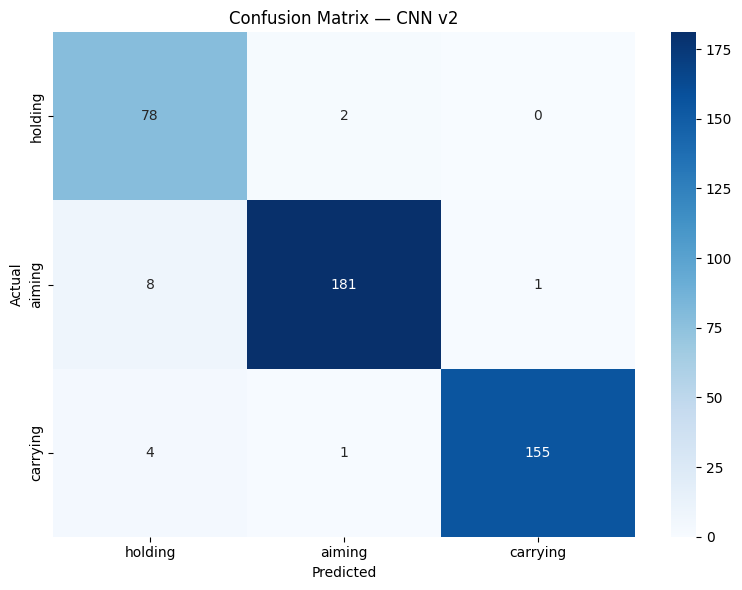

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

all_preds, all_labels = [], []

with torch.no_grad():
    for batch in test_loader_v2:
        person = batch[0].to(DEVICE)
        obj    = batch[1].to(DEVICE)
        union  = batch[2].to(DEVICE)
        labels = batch[3].to(DEVICE)

        outputs = model_v2(person, obj, union)
        preds = outputs.argmax(dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

IDX2LABEL = {v: k for k, v in LABEL2IDX.items()}
target_names = [IDX2LABEL[i] for i in range(3)]
print(classification_report(all_labels, all_preds, target_names=target_names))

cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=target_names, yticklabels=target_names, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix — CNN v2')
plt.tight_layout()
plt.show()

              precision    recall  f1-score   support

     holding       0.97      0.98      0.97        59
      aiming       1.00      0.99      1.00       198
    carrying       0.99      0.99      0.99       168

    accuracy                           0.99       425
   macro avg       0.99      0.99      0.99       425
weighted avg       0.99      0.99      0.99       425



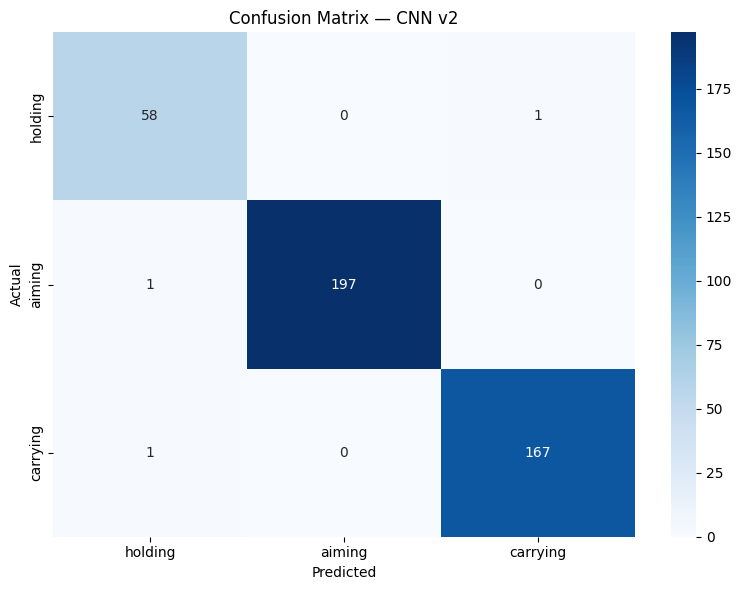

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

all_preds, all_labels = [], []

with torch.no_grad():
    for batch in test_loader_v2:
        person = batch[0].to(DEVICE)
        obj    = batch[1].to(DEVICE)
        union  = batch[2].to(DEVICE)
        labels = batch[3].to(DEVICE)

        outputs = model_v2(person, obj, union)
        preds = outputs.argmax(dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

IDX2LABEL = {v: k for k, v in LABEL2IDX.items()}
target_names = [IDX2LABEL[i] for i in range(3)]
print(classification_report(all_labels, all_preds, target_names=target_names))

cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=target_names, yticklabels=target_names, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix — CNN v2')
plt.tight_layout()
plt.show()

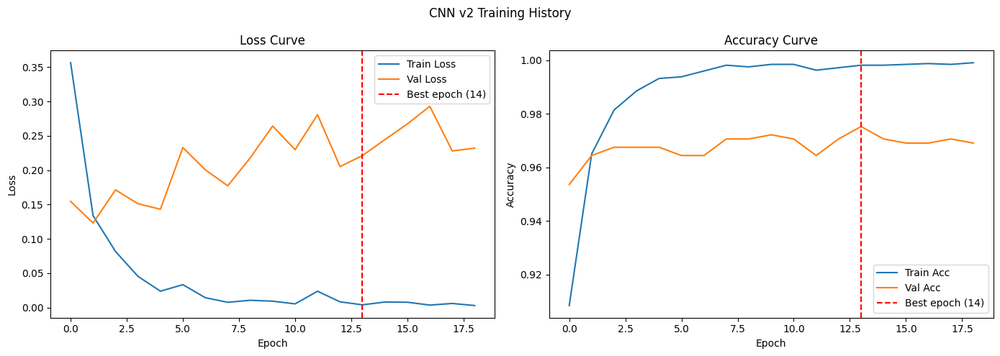

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.plot(history_v2['train_loss'], label='Train Loss')
ax1.plot(history_v2['val_loss'],   label='Val Loss')
ax1.axvline(x=13, color='red', linestyle='--', label='Best epoch (14)')
ax1.set_xlabel('Epoch'); ax1.set_ylabel('Loss')
ax1.set_title('Loss Curve'); ax1.legend()

ax2.plot(history_v2['train_acc'], label='Train Acc')
ax2.plot(history_v2['val_acc'],   label='Val Acc')
ax2.axvline(x=13, color='red', linestyle='--', label='Best epoch (14)')
ax2.set_xlabel('Epoch'); ax2.set_ylabel('Accuracy')
ax2.set_title('Accuracy Curve'); ax2.legend()

plt.suptitle('CNN v2 Training History')
plt.tight_layout()
plt.show()

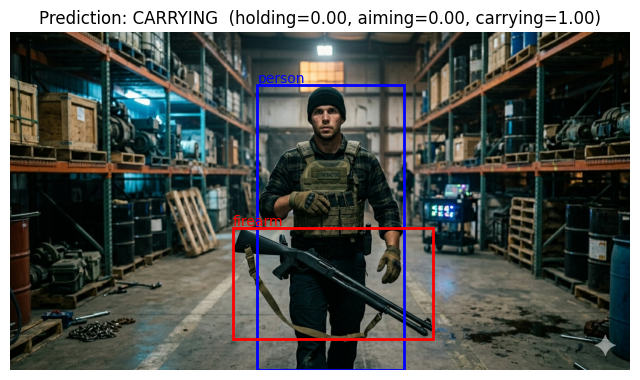

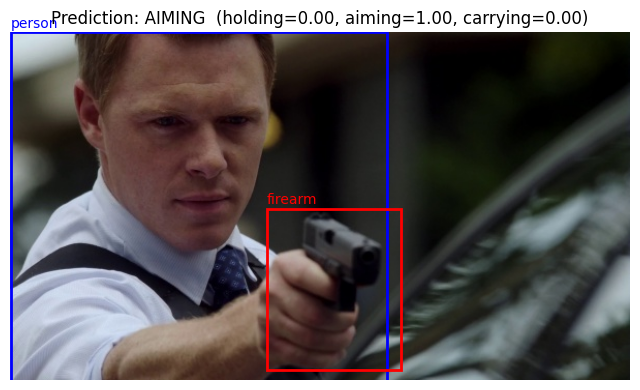

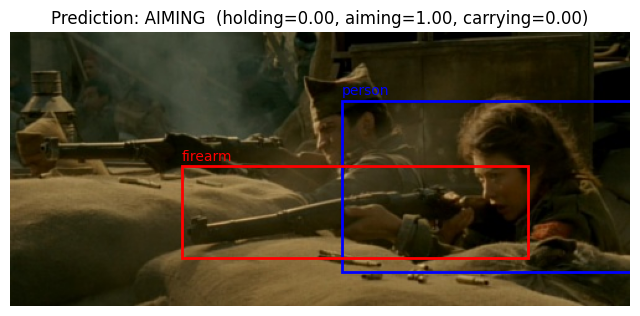

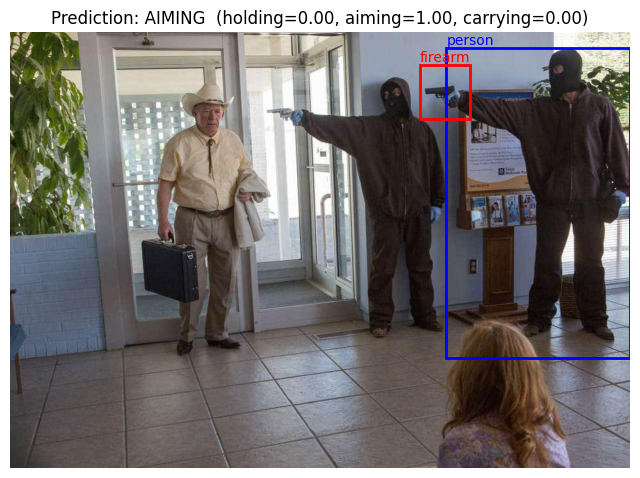

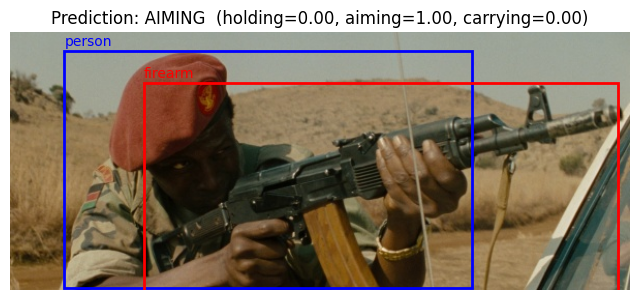

In [ ]:
from PIL import Image
import torchvision.transforms as T
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def predict_single_image(img_path, human_bbox, firearm_bbox):
    img = Image.open(img_path).convert('RGB')
    W, H = img.size

    def crop(bbox):
        x1, y1, x2, y2 = [int(b) for b in bbox]
        x1, y1 = max(0,x1), max(0,y1)
        x2, y2 = min(W,x2), min(H,y2)
        return img.crop((x1, y1, x2, y2))

    def union_box(b1, b2):
        return [min(b1[0],b2[0]), min(b1[1],b2[1]),
                max(b1[2],b2[2]), max(b1[3],b2[3])]

    person_crop = crop(human_bbox)
    obj_crop    = crop(firearm_bbox)
    union_crop  = crop(union_box(human_bbox, firearm_bbox))

    transform = val_transform  # reuse your existing val transform

    p = transform(person_crop).unsqueeze(0).to(DEVICE)
    o = transform(obj_crop).unsqueeze(0).to(DEVICE)
    u = transform(union_crop).unsqueeze(0).to(DEVICE)

    model_v2.eval()
    with torch.no_grad():
        out = model_v2(p, o, u)
        probs = torch.softmax(out, dim=1)[0]
        pred  = out.argmax(dim=1).item()

    label = IDX2LABEL[pred]

    # Show image with bboxes
    fig, ax = plt.subplots(1, figsize=(8, 6))
    ax.imshow(img)
    for bbox, color, name in [(human_bbox, 'blue', 'person'), (firearm_bbox, 'red', 'firearm')]:
        x1,y1,x2,y2 = bbox
        ax.add_patch(patches.Rectangle((x1,y1), x2-x1, y2-y1,
                     linewidth=2, edgecolor=color, facecolor='none'))
        ax.text(x1, y1-5, name, color=color, fontsize=10)
    ax.set_title(f'Prediction: {label.upper()}  '
                 f'(holding={probs[LABEL2IDX["holding"]]:.2f}, '
                 f'aiming={probs[LABEL2IDX["aiming"]]:.2f}, '
                 f'carrying={probs[LABEL2IDX["carrying"]]:.2f})')
    ax.axis('off')
    plt.show()

# Test on a few images from your test set
for ann in test_anns_v2[:5]:
    img_path = get_image_path(ann['image'])
    predict_single_image(img_path, ann['human_bbox'], ann['firearm_bbox'])

=== HOLDING ===


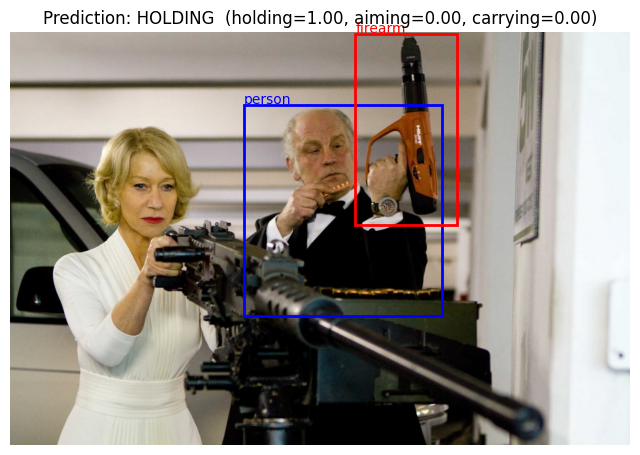

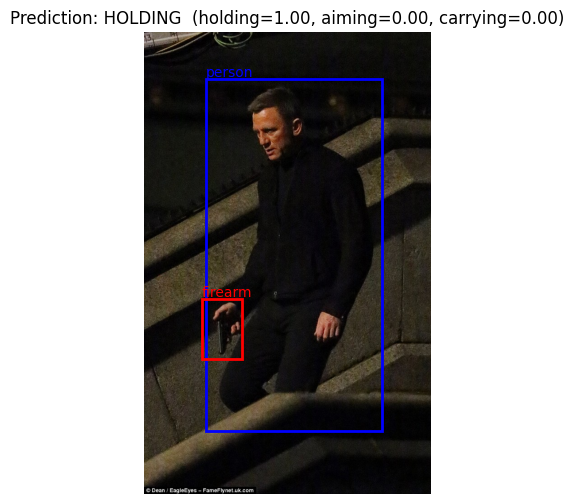

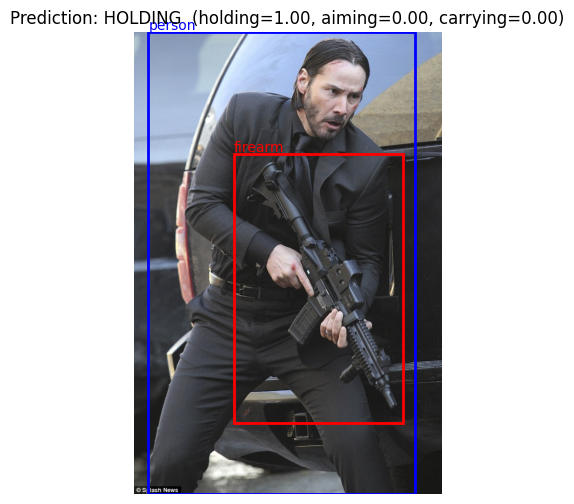

=== CARRYING ===


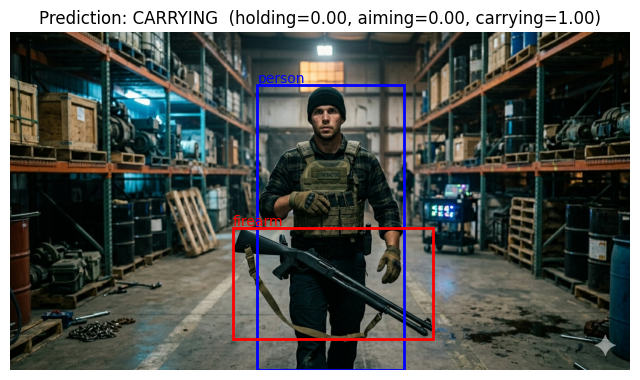

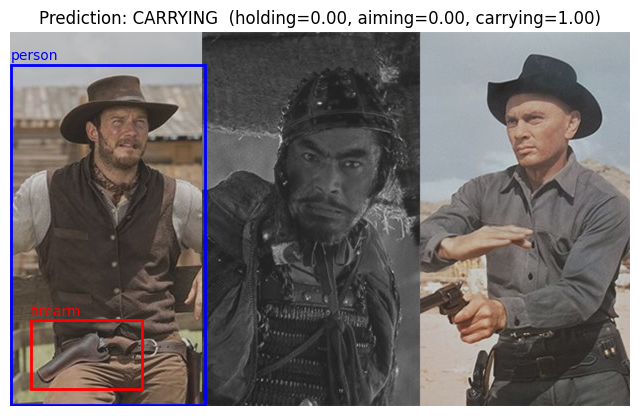

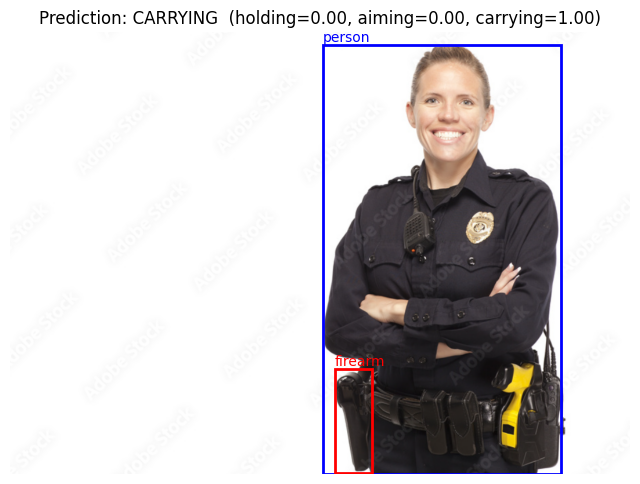

In [ ]:
# Get examples by class
holding_examples  = [a for a in test_anns_v2 if a['interaction'] == 'holding'][:3]
carrying_examples = [a for a in test_anns_v2 if a['interaction'] == 'carrying'][:3]

print("=== HOLDING ===")
for ann in holding_examples:
    img_path = get_image_path(ann['image'])
    predict_single_image(img_path, ann['human_bbox'], ann['firearm_bbox'])

print("=== CARRYING ===")
for ann in carrying_examples:
    img_path = get_image_path(ann['image'])
    predict_single_image(img_path, ann['human_bbox'], ann['firearm_bbox'])

In [ ]:
# ── BLIP-2 Integration ────────────────────────────────────────────────────────
!pip install -q transformers accelerate

from transformers import Blip2Processor, Blip2ForConditionalGeneration
import torch
from PIL import Image

# Load BLIP-2 model
print("Loading BLIP-2...")
blip_processor = Blip2Processor.from_pretrained("Salesforce/blip2-opt-2.7b")
blip_model = Blip2ForConditionalGeneration.from_pretrained(
    "Salesforce/blip2-opt-2.7b",
    torch_dtype=torch.float16
).to(DEVICE)
blip_model.eval()
print("BLIP-2 ready!")

Loading BLIP-2...


processor_config.json:   0%|          | 0.00/68.0 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/432 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.03k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/882 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/798k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/23.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/3.56M [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/122k [00:00<?, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/1247 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/141 [00:00<?, ?B/s]

BLIP-2 ready!


In [ ]:
def predict_with_blip(img_path, conf_thresh=0.3):
    # ── Step 1: YOLO detection ────────────────────────────────────────────────
    results     = best_yolo(str(img_path), conf=conf_thresh, verbose=False)
    boxes       = results[0].boxes

    if boxes is None or len(boxes) == 0:
        return None, "No detections", None

    cls_ids     = boxes.cls.cpu().numpy().astype(int)
    xyxy        = boxes.xyxy.cpu().numpy()
    persons     = xyxy[cls_ids == 0]
    firearms    = xyxy[cls_ids == 1]

    if len(persons) == 0:  return None, "No person detected", None
    if len(firearms) == 0: return None, "No firearm detected", None

    person_box  = persons[0].tolist()
    firearm_box = firearms[0].tolist()

    # ── Step 2: CNN classification ────────────────────────────────────────────
    img = Image.open(img_path).convert('RGB')
    ux1 = min(person_box[0], firearm_box[0])
    uy1 = min(person_box[1], firearm_box[1])
    ux2 = max(person_box[2], firearm_box[2])
    uy2 = max(person_box[3], firearm_box[3])

    person_crop  = hoi_transform(crop_box(img, person_box)).unsqueeze(0).to(DEVICE)
    firearm_crop = hoi_transform(crop_box(img, firearm_box)).unsqueeze(0).to(DEVICE)
    union_crop   = hoi_transform(crop_box(img, [ux1,uy1,ux2,uy2])).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        logits = hoi_model(person_crop, firearm_crop, union_crop)
        probs  = torch.softmax(logits, dim=1)[0].cpu().numpy()

    cnn_label = IDX2LABEL[int(probs.argmax())]
    cnn_conf  = {IDX2LABEL[i]: f"{probs[i]*100:.1f}%" for i in range(3)}

    # ── Step 3: BLIP-2 description of union crop ──────────────────────────────
    union_img   = crop_box(img, [ux1, uy1, ux2, uy2])

    # Ask BLIP a specific question for better answers
    question = "Question: What is happening in this image? Answer:"
    inputs      = blip_processor(
                    images=union_img,
                    text=question,
                    return_tensors="pt"
                  ).to(DEVICE, torch.float16)

    with torch.no_grad():
        generated = blip_model.generate(**inputs, max_new_tokens=50)

    blip_description = blip_processor.decode(
        generated[0], skip_special_tokens=True
    ).strip()

    return cnn_label, cnn_conf, blip_description

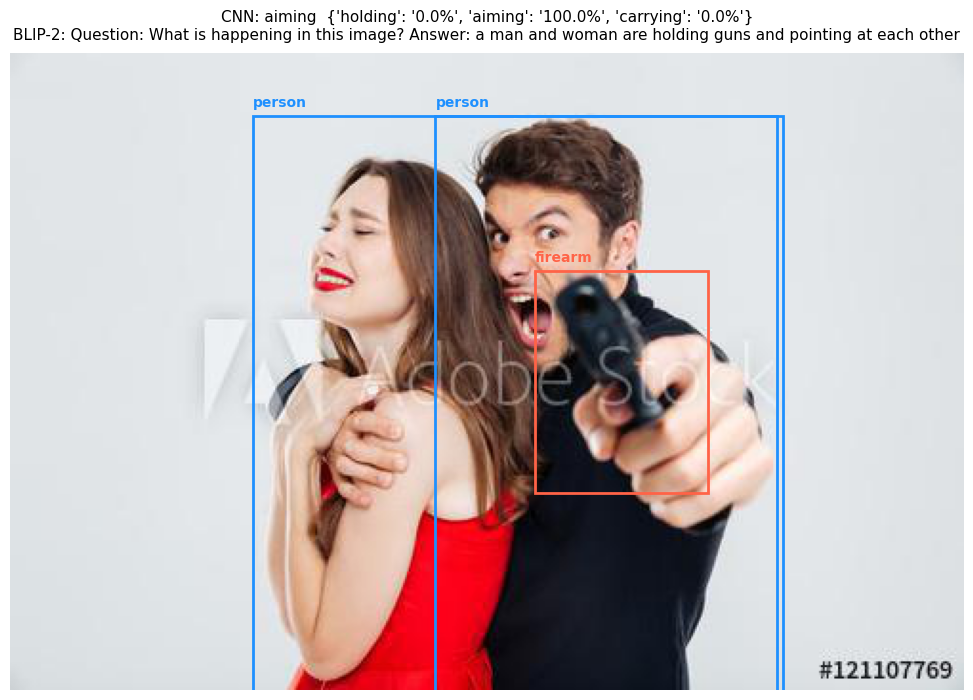

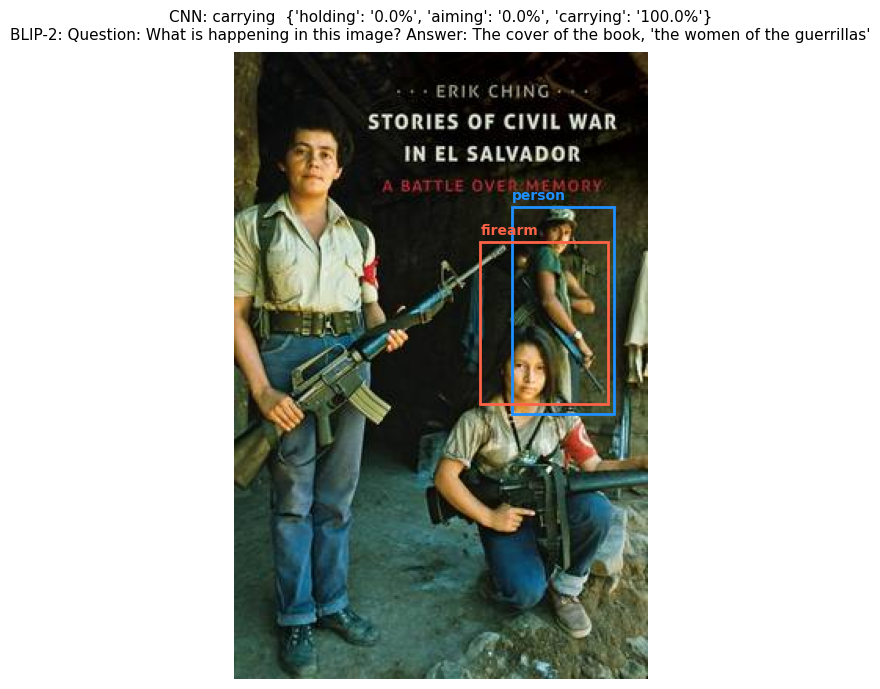

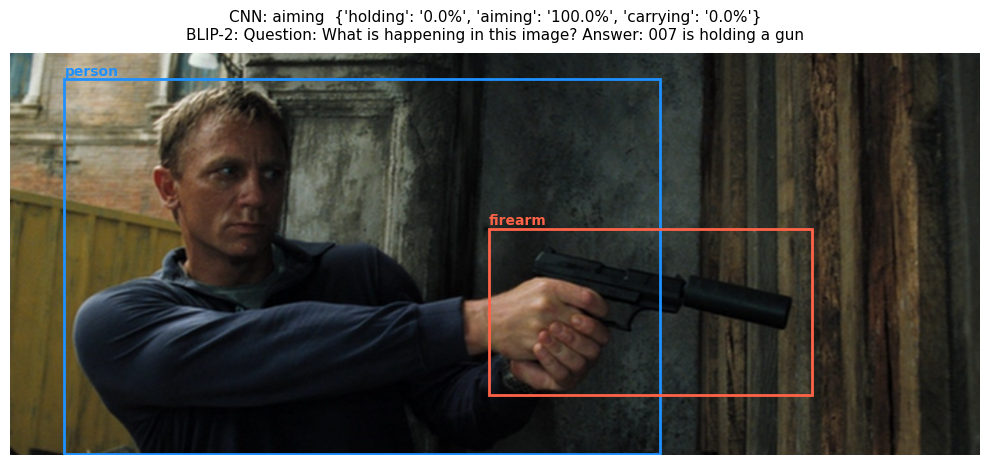

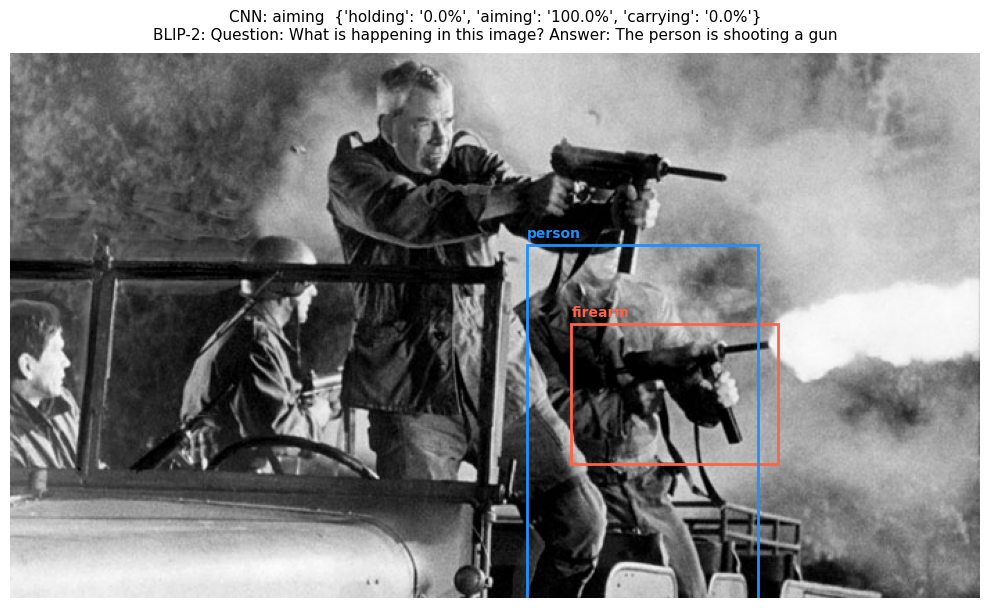

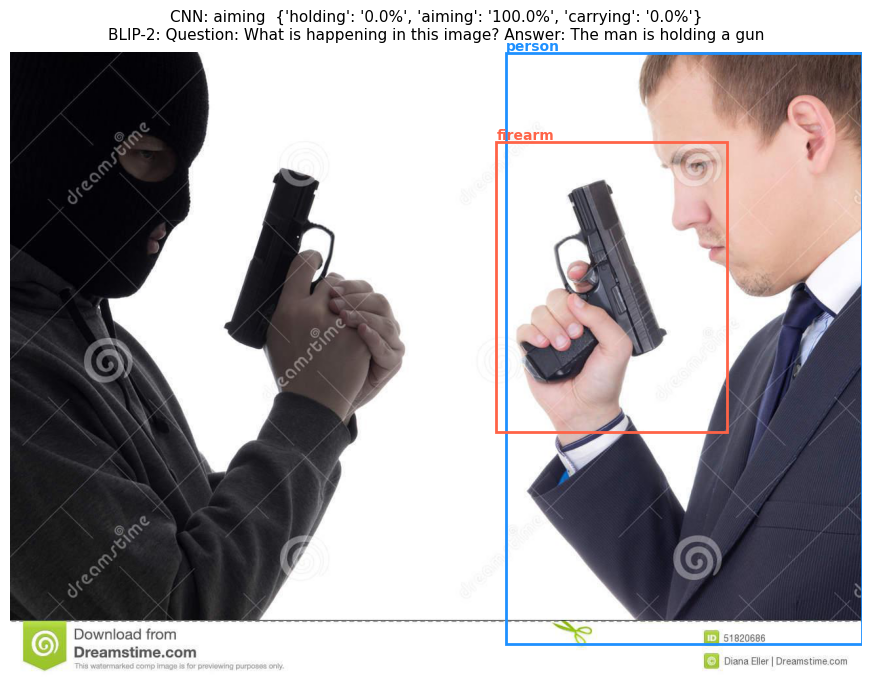

In [ ]:
import matplotlib.patches as patches
import matplotlib.pyplot as plt

def visualize_blip_prediction(img_path, conf_thresh=0.3):
    cnn_label, cnn_conf, blip_desc = predict_with_blip(img_path, conf_thresh)

    if cnn_label is None:
        print(f"Failed: {cnn_conf}")
        return

    img     = Image.open(img_path).convert('RGB')
    results = best_yolo(str(img_path), conf=conf_thresh, verbose=False)
    boxes   = results[0].boxes
    cls_ids = boxes.cls.cpu().numpy().astype(int)
    xyxy    = boxes.xyxy.cpu().numpy()

    fig, ax = plt.subplots(1, figsize=(10, 7))
    ax.imshow(img)

    colors = {0: 'dodgerblue', 1: 'tomato'}
    names  = {0: 'person', 1: 'firearm'}
    for box, cls in zip(xyxy, cls_ids):
        x1, y1, x2, y2 = box
        rect = patches.Rectangle(
            (x1, y1), x2-x1, y2-y1,
            linewidth=2, edgecolor=colors[cls], facecolor='none'
        )
        ax.add_patch(rect)
        ax.text(x1, y1-5, names[cls],
                color=colors[cls], fontsize=10, fontweight='bold')

    title = (f"CNN: {cnn_label}  {cnn_conf}\n"
             f"BLIP-2: {blip_desc}")
    ax.set_title(title, fontsize=11, pad=10)
    ax.axis('off')
    plt.tight_layout()
    plt.show()

# ── Run on test images ────────────────────────────────────────────────────────
test_imgs = list((YOLO_DIR / 'images' / 'val').iterdir())
for img_path in random.sample(test_imgs, min(5, len(test_imgs))):
    visualize_blip_prediction(img_path)